In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import itertools
from collections import OrderedDict
from functools import cmp_to_key

In [2]:
working_dir = './data/utime'
result_files = [
    os.path.join(working_dir, 'utime_conclusions.csv'),
    os.path.join(working_dir, 'utime_conclusions_2.csv'),
]
dfs = []
for result_file in result_files:
    df = pd.read_csv(result_file)
    dfs.append(df)
df = pd.concat(dfs, axis=0)
df = df.dropna()
perf_cols = list(df.columns[df.columns.str.contains('type')])
df[perf_cols] = df[perf_cols] * 100
df = df.replace('isruc1', 'isruc')

In [3]:
df

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,sleepedf,eeg_fpz_cz,isruc,eeg_f4_a1,62.379310,55.497888,78.390805,75.559945,77.666667,74.418389
1,sleepedf,eeg_fpz_cz,mass_ss1,eeg_f4,65.119048,58.118858,81.258503,74.673250,81.054422,73.840610
2,sleepedf,eeg_fpz_cz,mass_ss3,eeg_f4,76.471469,65.112144,86.371125,79.649167,86.520893,79.597216
3,sleepedf,eeg_pz_oz,sleepedf,eeg_fpz_cz,87.025721,67.407124,92.283644,75.949572,92.781015,77.847905
4,sleepedf,eeg_pz_oz,isruc,eeg_f4_a1,58.229885,53.192485,78.402299,75.569593,77.965517,74.982572
...,...,...,...,...,...,...,...,...,...,...
183,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.680031,69.860102,80.557994,68.515962,82.255390,73.532491
0,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,81.989924,68.839927,77.824065,66.121768,81.631467,69.985293
1,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,80.128768,70.103695,81.016486,68.092846,81.035996,72.420823
2,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.982368,67.935635,77.620616,66.040794,83.113738,70.869742


In [4]:
print(df['source_dataset'].unique())
print(df['source_channel'].unique())
print(df['target_dataset'].unique())
print(df['target_channel'].unique())

['sleepedf' 'isruc' 'mass_ss1' 'mass_ss3' 'shhs1_normal' 'shhs1_osa']
['eeg_fpz_cz' 'eeg_pz_oz' 'eeg_c4_a1' 'eeg_f3_a2' 'eeg_f4_a1' 'eeg_o2_a1'
 'eeg_c4' 'eeg_f3' 'eeg_f4' 'eeg_o2' 'eeg_pz' 'eeg_c3_a2' 'eeg_c3']
['isruc' 'mass_ss1' 'mass_ss3' 'sleepedf' 'shhs1_normal' 'shhs1_osa']
['eeg_f4_a1' 'eeg_f4' 'eeg_fpz_cz' 'eeg_c4_a1' 'eeg_c4']


In [5]:
def compare(txt1, txt2):
    order_chs = ['eeg_f','eeg_c','eeg_o','eeg_p']
    if order_chs.index(txt1[:5]) < order_chs.index(txt2[:5]):
        return -1
    elif order_chs.index(txt1[:5]) > order_chs.index(txt2[:5]):
        return 1
    else:
        return 0

In [6]:
list_chs = [
    'eeg_fpz_cz','eeg_pz_oz','eeg_c4_a1',
    'eeg_f3_a2','eeg_f4_a1','eeg_o2_a1',
    'eeg_c4','eeg_f4','eeg_o2','eeg_pz',
    'eeg_c3','eeg_f3','eeg_c3_a2']
sorted(list_chs, key=cmp_to_key(compare))

['eeg_fpz_cz',
 'eeg_f3_a2',
 'eeg_f4_a1',
 'eeg_f4',
 'eeg_f3',
 'eeg_c4_a1',
 'eeg_c4',
 'eeg_c3',
 'eeg_c3_a2',
 'eeg_o2_a1',
 'eeg_o2',
 'eeg_pz_oz',
 'eeg_pz']

In [7]:
# src=sleepedf: no eeg_c, eeg_o
# src=isruc: no eeg_p
# src=mass_ss4: no eeg_f, eeg_p

expect_chs = ['eeg_f','eeg_c','eeg_o','eeg_p']
for tds in df['target_dataset'].unique():
    tds_df = df[df['target_dataset'] == tds]
    for tch in tds_df['target_channel'].unique():
        tch_df = tds_df[tds_df['target_channel'] == tch]
        for sds in tch_df['source_dataset'].unique():
            sds_df = tch_df[tch_df['source_dataset'] == sds]
            schs = sds_df['source_channel'].unique()
            for c in expect_chs:
                if not any(c in _ for _ in schs):
                    if not (sds == 'sleepedf' and c in ['eeg_c','eeg_o']) and \
                       not (sds == 'mass_ss4' and c in ['eeg_f','eeg_p']) and \
                       not (sds == 'isruc' and c in ['eeg_p']) and \
                       not (sds == 'shhs1_normal' and c in ['eeg_f', 'eeg_p', 'eeg_o']) and \
                       not (sds == 'shhs1_osa' and c in ['eeg_f', 'eeg_p', 'eeg_o']):
                        print(f'tgt={tds}-{tch}, src={sds}: no {c}')
                    # print(f'tgt={tds}-{tch}, src={sds}: no {c}')

# should print only
# tgt=sleepedf-eeg_fpz_cz, src=sleepedf: no eeg_f

tgt=sleepedf-eeg_fpz_cz, src=sleepedf: no eeg_f


# Different Settings

In [8]:
# Mapping
type_map = {
    # train on source
    'type1': 'FS_src80_pred_src20',  # from scratch
    'type2': 'DT_src80_pred_tgt80',  # direct transfer
    'type3': 'DT_src80_pred_tgt20',  # direct transfer
    # train on target
    'type4': 'FS_tgt20_pred_tgt80',  # from scratch
    'type5': 'FS_tgt20_pred_tgt20',  # from scratch
    'type6': 'FS_tgt80_pred_tgt20',  # from scratch
    # transfer
    'type7': 'TF_src80-to-tgt20_pred_tgt80',  # transfer
    'type8': 'TF_src80-to-tgt20_pred_tgt20',  # transfer
    'type9': 'TF_src80-to-tgt80_pred_tgt20',  # transfer
}

# Quantify Differenting Factors

In [9]:
apnea_ds = ['isruc', 'shhs1_osa']

def same_d_same_c(row):
    same_d = row['source_dataset'] == row['target_dataset']
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if same_d and same_c: return True
    else: return False

def same_d_same_c_healthy(row):
    if same_d_same_c(row) and row['source_dataset'] not in apnea_ds:
        return True
    else: return False

def same_d_same_c_apnea(row):
    if same_d_same_c(row) and row['source_dataset'] in apnea_ds:
        return True
    else: return False

# ('Same Env & Same Ch (Same Cond)', ...),  # new
def same_d_same_c_same_cond(row):
    if same_d_same_c_healthy(row) or same_d_same_c_apnea(row):
        return True
    else: return False

# ('Same Env & Same Ch (Diff Cond)', ...),  # new
def same_d_same_c_diff_cond(row):
    diff_cond1 = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] in apnea_ds)
    diff_cond2 = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_env = ('shhs1' in row['source_dataset']) & ('shhs1' in row['target_dataset'])
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if same_c and same_env and (diff_cond1 or diff_cond2):
        return True
    else: return False

def same_d_diff_c(row):
    same_d = row['source_dataset'] == row['target_dataset']
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if same_d and not same_c: return True
    else: return False

def same_d_diff_c_healthy(row):
    if same_d_diff_c(row) and row['source_dataset'] not in apnea_ds:
        return True
    else: return False

def same_d_diff_c_apnea(row):
    if same_d_diff_c(row) and row['source_dataset'] in apnea_ds:
        return True
    else: return False

# ('Same Env & Diff Ch (Same Cond)', ...),  # new
def same_d_diff_c_same_cond(row):
    if same_d_diff_c_healthy(row) or same_d_diff_c_apnea(row):
        return True
    else: return False

# ('Same Env & Diff Ch (Diff Cond)', ...),  # new
def same_d_diff_c_diff_cond(row):
    diff_cond1 = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] in apnea_ds)
    diff_cond2 = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_env = ('shhs1' in row['source_dataset']) & ('shhs1' in row['target_dataset'])
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if not same_c and same_env and (diff_cond1 or diff_cond2):
        return True
    else: return False

def diff_d_same_c(row):
    same_d = row['source_dataset'] == row['target_dataset']
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if not same_d and same_c: return True
    else: return False

def diff_d_same_c_same_cond(row):
    same_healthy = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_apnea = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] in apnea_ds)
    if diff_d_same_c(row) and (same_healthy or same_apnea):
        return True
    else: return False

def diff_d_same_c_diff_cond(row):
    same_healthy = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_apnea = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] in apnea_ds)
    if diff_d_same_c(row) and (not same_healthy and not same_apnea):
        return True
    else: return False

def diff_d_diff_c(row):
    same_d = row['source_dataset'] == row['target_dataset']
    same_c = row['source_channel'][4] == row['target_channel'][4]
    if not same_d and not same_c: return True
    else: return False

def diff_d_diff_c_same_cond(row):
    same_healthy = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_apnea = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] in apnea_ds)
    if diff_d_diff_c(row) and (same_healthy or same_apnea):
        return True
    else: return False

def diff_d_diff_c_diff_cond(row):
    same_healthy = (row['source_dataset'] not in apnea_ds) & (row['target_dataset'] not in apnea_ds)
    same_apnea = (row['source_dataset'] in apnea_ds) & (row['target_dataset'] in apnea_ds)
    if diff_d_diff_c(row) and (not same_healthy and not same_apnea):
        return True
    else: return False

********************
Same Env & Same Ch (Same Cond) (size=8)
FS_tgt80_pred_tgt20           : acc=81.2410, mf1=74.0481
DT_src80_pred_tgt20           : acc=79.2240, mf1=70.7265
TF_src80-to-tgt80_pred_tgt20  : acc=82.5539, mf1=76.0550
DT-FS_80: acc=0.0389 mf1=0.0735
DT-FS_80: acc=0.0270 mf1=0.0578


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
11,isruc,eeg_f3_a2,isruc,eeg_f4_a1,76.505747,73.727285,78.390805,75.559945,80.505747,77.574969,0.024639,0.024857
23,mass_ss1,eeg_f3,mass_ss1,eeg_f4,80.901361,73.630996,81.258503,74.673250,81.309524,74.844475,0.004415,0.014155
47,mass_ss3,eeg_f3,mass_ss3,eeg_f4,74.135091,55.641138,86.371125,79.649167,86.236334,79.104844,0.165051,0.431480
89,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714,0.037816,0.043193
104,mass_ss1,eeg_c3,mass_ss1,eeg_c4,81.836735,73.484525,80.850340,73.551741,83.214286,75.136126,-0.012053,0.000915
136,mass_ss3,eeg_c3,mass_ss3,eeg_c4,84.334282,77.915844,86.026659,78.738549,86.341171,80.536650,0.020067,0.010559
174,shhs1_normal,eeg_c3_a2,shhs1_normal,eeg_c4_a1,79.621500,70.102691,80.548239,68.505817,79.455663,72.016565,0.011639,-0.022779
179,shhs1_osa,eeg_c3_a2,shhs1_osa,eeg_c4_a1,80.468901,68.777053,77.620616,66.040794,82.735904,72.182396,-0.035396,-0.039784


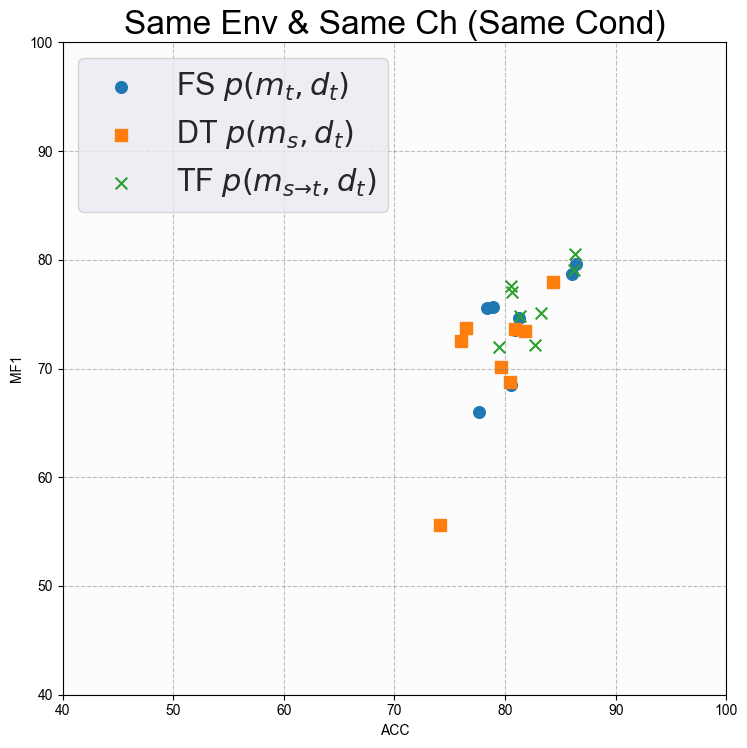

********************
Same Env & Same Ch (Diff Cond) (size=6)
FS_tgt80_pred_tgt20           : acc=79.1996, mf1=67.2202
DT_src80_pred_tgt20           : acc=80.5756, mf1=69.0901
TF_src80-to-tgt80_pred_tgt20  : acc=81.7656, mf1=71.3967
DT-FS_80: acc=0.0277 mf1=0.0271
DT-FS_80: acc=-0.0168 mf1=-0.0271


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
178,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.972680,67.926451,77.630304,66.043766,82.048053,69.465018,-0.041278,-0.027717
183,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.680031,69.860102,80.557994,68.515962,82.255390,73.532491,0.011019,-0.019240
0,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,81.989924,68.839927,77.824065,66.121768,81.631467,69.985293,-0.050809,-0.039485
1,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,80.128768,70.103695,81.016486,68.092846,81.035996,72.420823,0.011079,-0.028684
2,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.982368,67.935635,77.620616,66.040794,83.113738,70.869742,-0.041512,-0.027892
3,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.699542,69.874806,80.548239,68.505817,80.509219,72.106682,0.010649,-0.019592


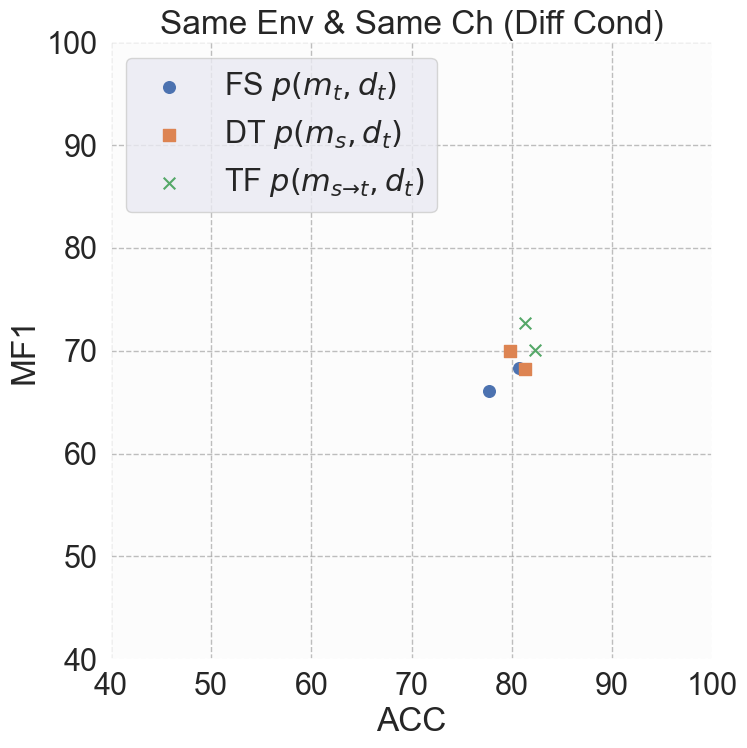

********************
Same Env & Diff Ch (Same Cond) (size=17)
FS_tgt80_pred_tgt20           : acc=82.9580, mf1=76.3707
DT_src80_pred_tgt20           : acc=80.1214, mf1=72.7531
TF_src80-to-tgt80_pred_tgt20  : acc=83.3022, mf1=77.1784
DT-FS_80: acc=0.0367 mf1=0.0526
DT-FS_80: acc=0.0358 mf1=0.0514


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
3,sleepedf,eeg_pz_oz,sleepedf,eeg_fpz_cz,87.025721,67.407124,92.283644,75.949572,92.781015,77.847905,0.060418,0.126729
8,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014,-0.007567,0.003950
16,isruc,eeg_o2_a1,isruc,eeg_f4_a1,74.034483,70.663816,78.390805,75.560228,77.034483,74.310409,0.058842,0.069292
21,mass_ss1,eeg_c4,mass_ss1,eeg_f4,80.170068,75.448537,81.258503,74.673250,80.952381,74.262886,0.013577,-0.010276
29,mass_ss1,eeg_o2,mass_ss1,eeg_f4,75.340136,68.766154,81.258503,74.673250,81.122449,74.775204,0.078555,0.085901
33,mass_ss1,eeg_pz,mass_ss1,eeg_f4,79.047619,72.654758,81.258503,74.673250,81.768707,76.271044,0.027969,0.027782
46,mass_ss3,eeg_c4,mass_ss3,eeg_f4,85.802007,77.256338,86.371125,79.649167,86.775498,80.069232,0.006633,0.030973
54,mass_ss3,eeg_o2,mass_ss3,eeg_f4,77.669612,70.391870,86.386102,79.663805,87.344616,81.229949,0.112225,0.131719
58,mass_ss3,eeg_pz,mass_ss3,eeg_f4,82.552044,76.194939,86.371125,79.649167,86.955219,81.723302,0.046263,0.045334
94,isruc,eeg_f4_a1,isruc,eeg_c4_a1,77.241379,74.836806,78.862069,75.665450,79.091954,76.625588,0.020982,0.011073


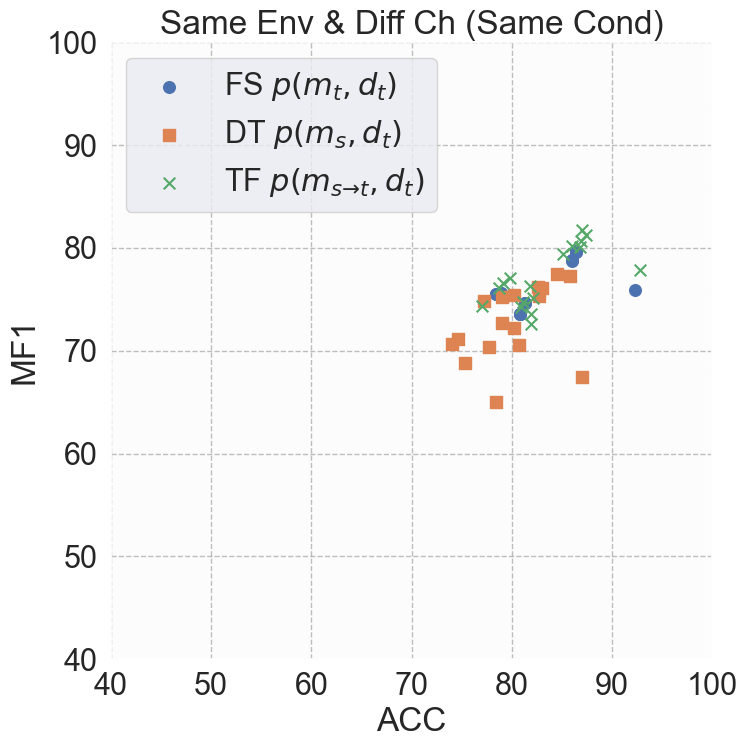

********************
Diff Env & Same Ch (Same Cond) (size=14)
FS_tgt80_pred_tgt20           : acc=83.6552, mf1=74.5671
DT_src80_pred_tgt20           : acc=69.5282, mf1=61.3316
TF_src80-to-tgt80_pred_tgt20  : acc=84.5859, mf1=76.5432
DT-FS_80: acc=0.2960 mf1=0.3022
DT-FS_80: acc=0.2960 mf1=0.3022


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
1,sleepedf,eeg_fpz_cz,mass_ss1,eeg_f4,65.119048,58.118858,81.258503,74.673250,81.054422,73.840610,0.247845,0.284837
2,sleepedf,eeg_fpz_cz,mass_ss3,eeg_f4,76.471469,65.112144,86.371125,79.649167,86.520893,79.597216,0.129456,0.223261
24,mass_ss1,eeg_f4,sleepedf,eeg_fpz_cz,40.793899,32.725588,92.283644,75.949572,92.899436,77.324007,1.262192,1.320801
26,mass_ss1,eeg_f4,mass_ss3,eeg_f4,85.158005,78.583502,86.386102,79.663805,88.003594,82.176025,0.014421,0.013747
48,mass_ss3,eeg_f4,sleepedf,eeg_fpz_cz,35.365449,32.781781,92.283644,75.949572,93.065227,79.025187,1.609429,1.316823
50,mass_ss3,eeg_f4,mass_ss1,eeg_f4,78.520408,70.703226,81.258503,74.673250,81.921769,75.451465,0.034871,0.056151
93,isruc,eeg_c4_a1,shhs1_osa,eeg_c4_a1,69.095137,63.673850,77.630304,66.047461,80.556094,71.411182,0.123528,0.037278
106,mass_ss1,eeg_c4,mass_ss3,eeg_c4,83.615396,77.660072,86.041635,78.782988,86.865359,81.252809,0.029017,0.014459
107,mass_ss1,eeg_c4,shhs1_normal,eeg_c4_a1,65.232660,54.935862,80.548239,68.505817,80.401912,69.990066,0.234784,0.247015
138,mass_ss3,eeg_c4,mass_ss1,eeg_c4,80.051020,69.025058,80.833333,73.538756,83.979592,76.971283,0.009773,0.065392


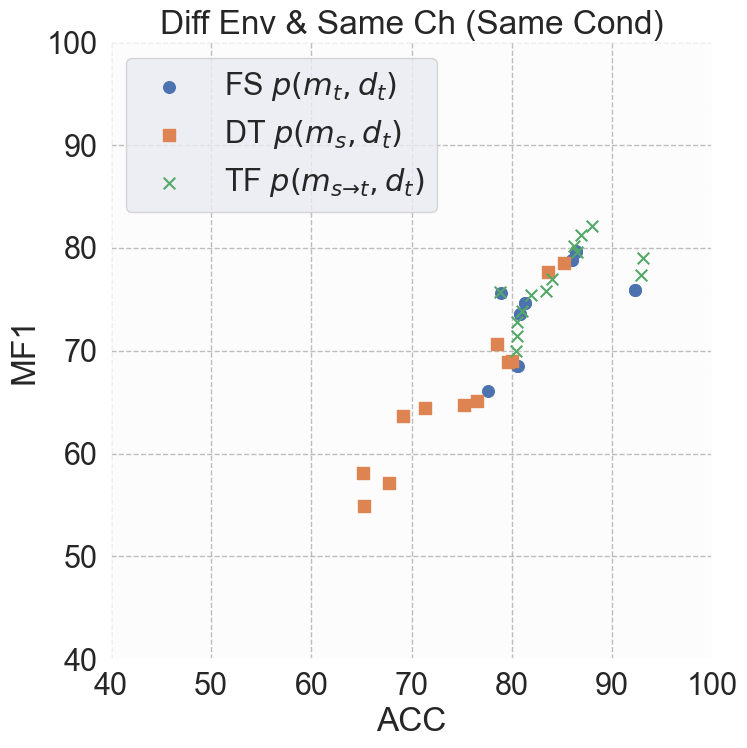

********************
Diff Env & Same Ch (Diff Cond) (size=22)
FS_tgt80_pred_tgt20           : acc=80.7461, mf1=72.3850
DT_src80_pred_tgt20           : acc=74.3895, mf1=65.7350
TF_src80-to-tgt80_pred_tgt20  : acc=82.5358, mf1=75.1430
DT-FS_80: acc=0.1046 mf1=0.1246
DT-FS_80: acc=0.0924 mf1=0.1099


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
0,sleepedf,eeg_fpz_cz,isruc,eeg_f4_a1,62.379310,55.497888,78.390805,75.559945,77.666667,74.418389,0.256680,0.361492
12,isruc,eeg_f4_a1,sleepedf,eeg_fpz_cz,74.960921,57.978285,92.283644,75.949572,93.377860,79.007333,0.231090,0.309966
13,isruc,eeg_f4_a1,mass_ss1,eeg_f4,72.227891,68.134682,81.258503,74.673250,81.190476,75.760566,0.125029,0.095965
14,isruc,eeg_f4_a1,mass_ss3,eeg_f4,80.365434,74.820209,86.371125,79.649167,88.303130,82.417438,0.074730,0.064541
25,mass_ss1,eeg_f4,isruc,eeg_f4_a1,67.206897,62.347581,78.390805,75.560228,79.908046,76.068439,0.166410,0.211919
49,mass_ss3,eeg_f4,isruc,eeg_f4_a1,65.505747,59.760486,78.402299,75.569593,80.068966,76.705308,0.196877,0.264541
90,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373,0.053880,0.013461
91,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439,0.045314,0.023534
92,isruc,eeg_c4_a1,shhs1_normal,eeg_c4_a1,73.885475,65.591308,80.548239,68.505817,81.933470,73.819644,0.090177,0.044434
105,mass_ss1,eeg_c4,isruc,eeg_c4_a1,67.712644,63.722099,78.862069,75.662979,79.896552,76.909317,0.164658,0.187390


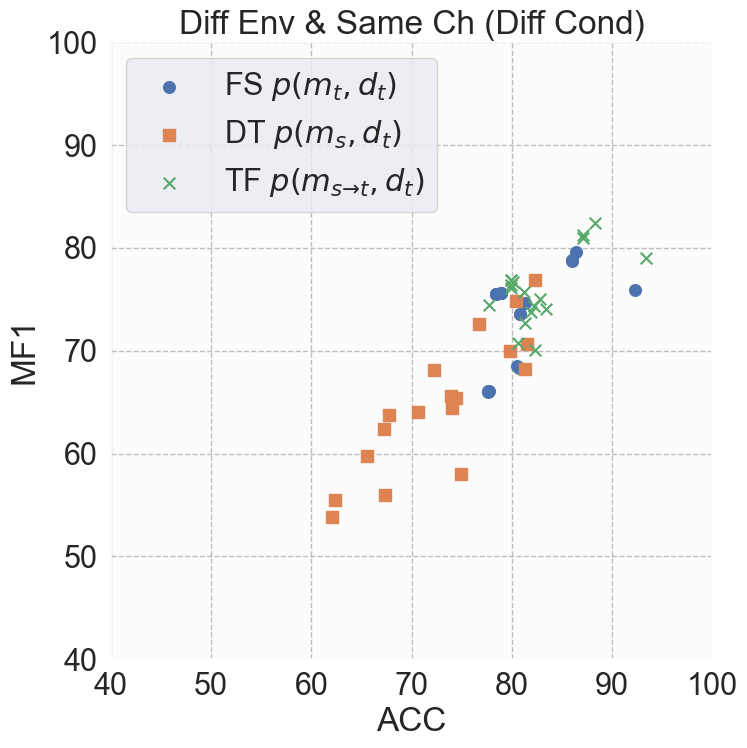

********************
Diff Env & Diff Ch (Same Cond) (size=38)
FS_tgt80_pred_tgt20           : acc=84.1191, mf1=74.2250
DT_src80_pred_tgt20           : acc=67.5656, mf1=59.2596
TF_src80-to-tgt80_pred_tgt20  : acc=85.0494, mf1=76.2044
DT-FS_80: acc=0.3198 mf1=0.3155
DT-FS_80: acc=0.3198 mf1=0.3155


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
5,sleepedf,eeg_pz_oz,mass_ss1,eeg_f4,55.000000,51.667428,81.258503,74.673250,78.486395,72.742593,0.477427,0.445267
6,sleepedf,eeg_pz_oz,mass_ss3,eeg_f4,68.264191,60.984709,86.386102,79.663805,87.464430,82.304232,0.265467,0.306291
19,mass_ss1,eeg_c4,sleepedf,eeg_fpz_cz,36.615982,33.897684,92.283644,75.949572,92.951542,76.099103,1.520310,1.240553
22,mass_ss1,eeg_c4,mass_ss3,eeg_f4,82.971394,76.848886,86.371125,79.649167,87.449453,81.003333,0.040975,0.036439
27,mass_ss1,eeg_o2,sleepedf,eeg_fpz_cz,42.608119,35.067499,92.283644,75.949572,93.141017,78.051551,1.165870,1.165811
30,mass_ss1,eeg_o2,mass_ss3,eeg_f4,81.623484,72.674188,86.371125,79.649167,87.674105,82.091538,0.058165,0.095976
31,mass_ss1,eeg_pz,sleepedf,eeg_fpz_cz,44.967079,45.263360,92.283644,75.949572,92.951542,77.905034,1.052249,0.677948
34,mass_ss1,eeg_pz,mass_ss3,eeg_f4,84.558934,77.009965,86.371125,79.649167,87.614198,81.902440,0.021431,0.034271
43,mass_ss3,eeg_c4,sleepedf,eeg_fpz_cz,49.760788,41.056773,92.283644,75.949572,93.534176,78.138093,0.854545,0.849867
45,mass_ss3,eeg_c4,mass_ss1,eeg_f4,80.850340,74.334447,81.258503,74.673250,82.006803,74.695996,0.005048,0.004558


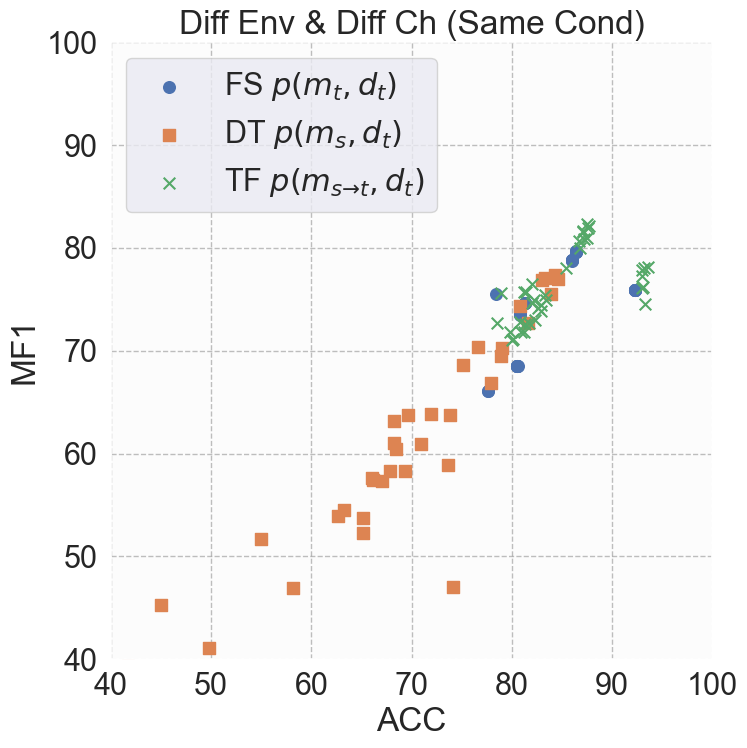

********************
Diff Env & Diff Ch (Diff Cond) (size=39)
FS_tgt80_pred_tgt20           : acc=80.8634, mf1=73.6069
DT_src80_pred_tgt20           : acc=67.0667, mf1=60.1490
TF_src80-to-tgt80_pred_tgt20  : acc=82.1851, mf1=75.9846
DT-FS_80: acc=0.2341 mf1=0.2522
DT-FS_80: acc=0.2341 mf1=0.2522


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['acc_r_ij'] = gain_pc_acc
/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/375419946.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['mf1_r_ij'] = gain_pc_mf1


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
4,sleepedf,eeg_pz_oz,isruc,eeg_f4_a1,58.229885,53.192485,78.402299,75.569593,77.965517,74.982572,0.346427,0.420682
7,isruc,eeg_c4_a1,sleepedf,eeg_fpz_cz,41.120743,35.790627,92.283644,75.949572,92.790488,77.352753,1.244211,1.122052
9,isruc,eeg_c4_a1,mass_ss1,eeg_f4,75.204082,71.195338,81.258503,74.673250,81.921769,77.419974,0.080507,0.048850
10,isruc,eeg_c4_a1,mass_ss3,eeg_f4,80.799760,74.943225,86.386102,79.663805,87.853827,82.141815,0.069138,0.062989
15,isruc,eeg_o2_a1,sleepedf,eeg_fpz_cz,39.514945,36.953114,92.283644,75.949572,93.084174,78.266766,1.335411,1.055296
17,isruc,eeg_o2_a1,mass_ss1,eeg_f4,66.904762,62.009818,81.258503,74.673250,81.564626,75.730742,0.214540,0.204217
18,isruc,eeg_o2_a1,mass_ss3,eeg_f4,74.060207,69.834846,86.386102,79.661048,88.153362,83.399301,0.166431,0.140706
20,mass_ss1,eeg_c4,isruc,eeg_f4_a1,68.275862,64.086007,78.390805,75.560228,79.804598,76.482537,0.148148,0.179044
28,mass_ss1,eeg_o2,isruc,eeg_f4_a1,66.850575,61.953803,78.379310,75.550581,78.632184,76.109653,0.172455,0.219466
32,mass_ss1,eeg_pz,isruc,eeg_f4_a1,69.586207,65.086625,78.379310,75.549004,80.195402,77.312085,0.126363,0.160745


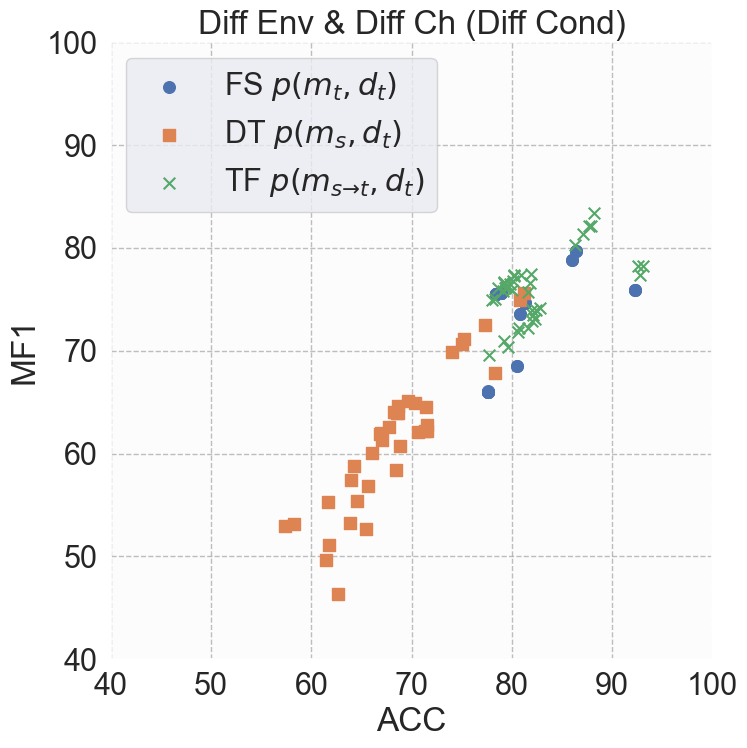

In [10]:
# For publication

# Mapping
type_map_pub = {
    # train on source
    'type3': r'DT $p(m_s,d_t)$',  # direct transfer
    # train on target
    'type6': r'FS $p(m_t,d_t)$',  # from scratch
    # transfer
    'type9': r'TF $p(m_{s \to t},d_t)$',  # transfer
}

marker_map = {
    # train on source
    'type3': "s",  # direct transfer
    # train on target
    'type6': "o",  # from scratch
    # transfer
    'type9': "x",  # transfer
}

def plot_acc_mf1(raw_df, types, title):
    df = raw_df.groupby(by=['source_dataset','source_channel','target_dataset','target_channel']).mean().reset_index()
    # df = raw_df
    fig, ax = plt.subplots(1, 1, figsize=(8,8))
    sns.set(font_scale=2)
    for t in types:
        acc = df[f'acc_type{t}'].values
        mf1 = df[f'mf1_type{t}'].values
        ax.scatter(
            acc, mf1, s=70,
            label=f'{type_map_pub[f"type{t}"]}',
            marker=marker_map[f"type{t}"])
    ax.set(facecolor='#FCFCFC')
    ax.set_xlabel('ACC')
    ax.set_ylabel('MF1')
    ax.grid(color='grey', linestyle='--', alpha=0.5)
    plt.xlim([40,100])
    plt.ylim([40,100])
    plt.title(f'{title}')
    plt.tight_layout()
    plt.legend(loc='upper left')
    plt.savefig(f'{title}.jpg', format='jpg', dpi=500, bbox_inches='tight')
    plt.show()
    plt.close('all')

# type6 / type3 : from scratch (80%) / direct transfer (80%)
t1 = 6
t2 = 3
types = [6,3,9]
exps = [
    # ('Same Env & Same Ch (Healthy)', same_d_same_c_healthy),
    # ('Same Env & Same Ch (Apnea)', same_d_same_c_apnea),
    # ('Same Env & Diff Ch (Healthy)', same_d_diff_c_healthy),
    # ('Same Env & Diff Ch (Apnea)', same_d_diff_c_apnea),
    ('Same Env & Same Ch (Same Cond)', same_d_same_c_same_cond),  # merge 1&2
    ('Same Env & Same Ch (Diff Cond)', same_d_same_c_diff_cond),  # new
    ('Same Env & Diff Ch (Same Cond)', same_d_diff_c_same_cond),  # merge 3&4
    # ('Same Env & Diff Ch (Diff Cond)', same_d_diff_c_diff_cond),  # dataset is not available
    ('Diff Env & Same Ch (Same Cond)', diff_d_same_c_same_cond),
    ('Diff Env & Same Ch (Diff Cond)', diff_d_same_c_diff_cond),
    ('Diff Env & Diff Ch (Same Cond)', diff_d_diff_c_same_cond),
    ('Diff Env & Diff Ch (Diff Cond)', diff_d_diff_c_diff_cond),
]

r_ijs = {}
for title, filter_fn in exps:
    print('*'*20)
    _df = df[df.apply(filter_fn, axis=1)]
    print(f'{title} (size={len(_df)})')
    for t in types:
        accs = _df[f'acc_type{t}'].values
        mf1s = _df[f'mf1_type{t}'].values
        print(f'{type_map[f"type{t}"]:30s}: acc={np.mean(accs):.4f}, mf1={np.mean(mf1s):.4f}')
    # gain_pc_acc = (_df[f'acc_type6'].values - _df[f'acc_type3'].values) / _df[f'acc_type3'].values
    # gain_pc_mf1 = (_df[f'mf1_type6'].values - _df[f'mf1_type3'].values) / _df[f'mf1_type3'].values
    gain_pc_acc = (_df[f'acc_type{t1}'].values / _df[f'acc_type{t2}'].values) - 1
    gain_pc_mf1 = (_df[f'mf1_type{t1}'].values / _df[f'mf1_type{t2}'].values) - 1
    # print(np.abs(gain_pc))
    print(f'DT-FS_80: acc={np.mean(np.abs(gain_pc_acc)):.4f} mf1={np.mean(np.abs(gain_pc_mf1)):.4f}')
    print(f'DT-FS_80: acc={np.mean(gain_pc_acc):.4f} mf1={np.mean(gain_pc_mf1):.4f}')
    _df['acc_r_ij'] = gain_pc_acc
    _df['mf1_r_ij'] = gain_pc_mf1
    display(_df)
    plot_acc_mf1(_df, types, title)
    r_ijs[title] = _df

In [11]:
df.groupby(by=['source_dataset','source_channel','target_dataset','target_channel']).mean().reset_index()

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714
1,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014
2,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373
3,isruc,eeg_c4_a1,mass_ss1,eeg_f4,75.204082,71.195338,81.258503,74.673250,81.921769,77.419974
4,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439
...,...,...,...,...,...,...,...,...,...,...
129,sleepedf,eeg_pz_oz,mass_ss3,eeg_c4,71.903549,63.807158,86.026659,78.738549,87.090010,81.653566
130,sleepedf,eeg_pz_oz,mass_ss3,eeg_f4,68.264191,60.984709,86.386102,79.663805,87.464430,82.304232
131,sleepedf,eeg_pz_oz,shhs1_normal,eeg_c4_a1,69.368842,58.290075,80.538484,68.498365,80.011706,71.008884
132,sleepedf,eeg_pz_oz,shhs1_osa,eeg_c4_a1,61.741910,51.124862,77.620616,66.040794,77.736873,69.632852


In [12]:
tf_settings = list(r_ijs.keys())
for _ in tf_settings:
    print(_)

Same Env & Same Ch (Same Cond)
Same Env & Same Ch (Diff Cond)
Same Env & Diff Ch (Same Cond)
Diff Env & Same Ch (Same Cond)
Diff Env & Same Ch (Diff Cond)
Diff Env & Diff Ch (Same Cond)
Diff Env & Diff Ch (Diff Cond)


In [13]:
sum_r_ijs = {}
for k in tf_settings:
    sum_acc = np.mean(np.abs(r_ijs[k]['acc_r_ij']))*100
    sum_mf1 = np.mean(np.abs(r_ijs[k]['mf1_r_ij']))*100
    sum_r_ijs[k] = {
        'acc': sum_acc,
        'mf1': sum_mf1
    }
    print(f"{k}:\tacc_r_ij={sum_acc:.2f}\tmf1_r_ij={sum_mf1:.2f}")
print(sum_r_ijs)

Same Env & Same Ch (Same Cond):	acc_r_ij=3.89	mf1_r_ij=7.35
Same Env & Same Ch (Diff Cond):	acc_r_ij=2.77	mf1_r_ij=2.71
Same Env & Diff Ch (Same Cond):	acc_r_ij=3.67	mf1_r_ij=5.26
Diff Env & Same Ch (Same Cond):	acc_r_ij=29.60	mf1_r_ij=30.22
Diff Env & Same Ch (Diff Cond):	acc_r_ij=10.46	mf1_r_ij=12.46
Diff Env & Diff Ch (Same Cond):	acc_r_ij=31.98	mf1_r_ij=31.55
Diff Env & Diff Ch (Diff Cond):	acc_r_ij=23.41	mf1_r_ij=25.22
{'Same Env & Same Ch (Same Cond)': {'acc': 3.8884540490420894, 'mf1': 7.346535207757314}, 'Same Env & Same Ch (Diff Cond)': {'acc': 2.7724222689892555, 'mf1': 2.710164228480111}, 'Same Env & Diff Ch (Same Cond)': {'acc': 3.6727094715626047, 'mf1': 5.2615952325170054}, 'Diff Env & Same Ch (Same Cond)': {'acc': 29.60302679546509, 'mf1': 30.219229654744645}, 'Diff Env & Same Ch (Diff Cond)': {'acc': 10.457480065993252, 'mf1': 12.464201149149071}, 'Diff Env & Diff Ch (Same Cond)': {'acc': 31.97952215816265, 'mf1': 31.545419708399347}, 'Diff Env & Diff Ch (Diff Cond)': {

In [14]:
for k in tf_settings:
    sum_acc = np.mean(r_ijs[k]['acc_r_ij'])*100
    sum_mf1 = np.mean(r_ijs[k]['mf1_r_ij'])*100
    print(f"{k}:\tacc_r_ij={sum_acc:.2f}\tmf1_r_ij={sum_mf1:.2f}")

Same Env & Same Ch (Same Cond):	acc_r_ij=2.70	mf1_r_ij=5.78
Same Env & Same Ch (Diff Cond):	acc_r_ij=-1.68	mf1_r_ij=-2.71
Same Env & Diff Ch (Same Cond):	acc_r_ij=3.58	mf1_r_ij=5.14
Diff Env & Same Ch (Same Cond):	acc_r_ij=29.60	mf1_r_ij=30.22
Diff Env & Same Ch (Diff Cond):	acc_r_ij=9.24	mf1_r_ij=10.99
Diff Env & Diff Ch (Same Cond):	acc_r_ij=31.98	mf1_r_ij=31.55
Diff Env & Diff Ch (Diff Cond):	acc_r_ij=23.41	mf1_r_ij=25.22


In [15]:
for k in tf_settings:
    print(f"{k}:", end='\t')
    for t in [6,3,9]:
        accs = r_ijs[k][f'acc_type{t}'].values
        mf1s = r_ijs[k][f'mf1_type{t}'].values
        print(f'{np.mean(accs):.4f}\t{np.mean(mf1s):.4f}', end='\t')
    print()

Same Env & Same Ch (Same Cond):	81.2410	74.0481	79.2240	70.7265	82.5539	76.0550	
Same Env & Same Ch (Diff Cond):	79.1996	67.2202	80.5756	69.0901	81.7656	71.3967	
Same Env & Diff Ch (Same Cond):	82.9580	76.3707	80.1214	72.7531	83.3022	77.1784	
Diff Env & Same Ch (Same Cond):	83.6552	74.5671	69.5282	61.3316	84.5859	76.5432	
Diff Env & Same Ch (Diff Cond):	80.7461	72.3850	74.3895	65.7350	82.5358	75.1430	
Diff Env & Diff Ch (Same Cond):	84.1191	74.2250	67.5656	59.2596	85.0494	76.2044	
Diff Env & Diff Ch (Diff Cond):	80.8634	73.6069	67.0667	60.1490	82.1851	75.9846	


In [16]:
# Statistical Test
from scipy.stats import mannwhitneyu
from scipy.stats import shapiro

compare_k = 'mf1_r_ij'
for k in tf_settings:
    vals = r_ijs[k][compare_k]
    if len(vals) < 3:
        display(r_ijs[k])
    stat, p = shapiro(vals)
    print(f"{k}: n={len(r_ijs[k][compare_k])} stat={stat:.4f}, p={p:.4f} ({'Not ' if p<=0.05 else ''}Gaussian)")
    if len(r_ijs[k][compare_k]) < 30:
        display(r_ijs[k])

p_mat = []
for k1 in tf_settings:
    row = []
    for k2 in tf_settings:
        stat, p = mannwhitneyu(np.abs(r_ijs[k1][compare_k]), np.abs(r_ijs[k2][compare_k]))
        print(f"{k1}-{k2}: stat={stat:.4f} p={p:.4f} ({'Same' if p>0.05 else 'Diff'} Distribution)")
        row.append(p)
    p_mat.append(row)
p_mat = np.array(p_mat)

Same Env & Same Ch (Same Cond): n=8 stat=0.5864, p=0.0001 (Not Gaussian)


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
11,isruc,eeg_f3_a2,isruc,eeg_f4_a1,76.505747,73.727285,78.390805,75.559945,80.505747,77.574969,0.024639,0.024857
23,mass_ss1,eeg_f3,mass_ss1,eeg_f4,80.901361,73.630996,81.258503,74.673250,81.309524,74.844475,0.004415,0.014155
47,mass_ss3,eeg_f3,mass_ss3,eeg_f4,74.135091,55.641138,86.371125,79.649167,86.236334,79.104844,0.165051,0.431480
89,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714,0.037816,0.043193
104,mass_ss1,eeg_c3,mass_ss1,eeg_c4,81.836735,73.484525,80.850340,73.551741,83.214286,75.136126,-0.012053,0.000915
136,mass_ss3,eeg_c3,mass_ss3,eeg_c4,84.334282,77.915844,86.026659,78.738549,86.341171,80.536650,0.020067,0.010559
174,shhs1_normal,eeg_c3_a2,shhs1_normal,eeg_c4_a1,79.621500,70.102691,80.548239,68.505817,79.455663,72.016565,0.011639,-0.022779
179,shhs1_osa,eeg_c3_a2,shhs1_osa,eeg_c4_a1,80.468901,68.777053,77.620616,66.040794,82.735904,72.182396,-0.035396,-0.039784


Same Env & Same Ch (Diff Cond): n=6 stat=0.8830, p=0.2832 (Gaussian)


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
178,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.972680,67.926451,77.630304,66.043766,82.048053,69.465018,-0.041278,-0.027717
183,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.680031,69.860102,80.557994,68.515962,82.255390,73.532491,0.011019,-0.019240
0,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,81.989924,68.839927,77.824065,66.121768,81.631467,69.985293,-0.050809,-0.039485
1,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,80.128768,70.103695,81.016486,68.092846,81.035996,72.420823,0.011079,-0.028684
2,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.982368,67.935635,77.620616,66.040794,83.113738,70.869742,-0.041512,-0.027892
3,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.699542,69.874806,80.548239,68.505817,80.509219,72.106682,0.010649,-0.019592


Same Env & Diff Ch (Same Cond): n=17 stat=0.8998, p=0.0674 (Gaussian)


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
3,sleepedf,eeg_pz_oz,sleepedf,eeg_fpz_cz,87.025721,67.407124,92.283644,75.949572,92.781015,77.847905,0.060418,0.126729
8,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014,-0.007567,0.003950
16,isruc,eeg_o2_a1,isruc,eeg_f4_a1,74.034483,70.663816,78.390805,75.560228,77.034483,74.310409,0.058842,0.069292
21,mass_ss1,eeg_c4,mass_ss1,eeg_f4,80.170068,75.448537,81.258503,74.673250,80.952381,74.262886,0.013577,-0.010276
29,mass_ss1,eeg_o2,mass_ss1,eeg_f4,75.340136,68.766154,81.258503,74.673250,81.122449,74.775204,0.078555,0.085901
33,mass_ss1,eeg_pz,mass_ss1,eeg_f4,79.047619,72.654758,81.258503,74.673250,81.768707,76.271044,0.027969,0.027782
46,mass_ss3,eeg_c4,mass_ss3,eeg_f4,85.802007,77.256338,86.371125,79.649167,86.775498,80.069232,0.006633,0.030973
54,mass_ss3,eeg_o2,mass_ss3,eeg_f4,77.669612,70.391870,86.386102,79.663805,87.344616,81.229949,0.112225,0.131719
58,mass_ss3,eeg_pz,mass_ss3,eeg_f4,82.552044,76.194939,86.371125,79.649167,86.955219,81.723302,0.046263,0.045334
94,isruc,eeg_f4_a1,isruc,eeg_c4_a1,77.241379,74.836806,78.862069,75.665450,79.091954,76.625588,0.020982,0.011073


Diff Env & Same Ch (Same Cond): n=14 stat=0.6115, p=0.0001 (Not Gaussian)


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
1,sleepedf,eeg_fpz_cz,mass_ss1,eeg_f4,65.119048,58.118858,81.258503,74.673250,81.054422,73.840610,0.247845,0.284837
2,sleepedf,eeg_fpz_cz,mass_ss3,eeg_f4,76.471469,65.112144,86.371125,79.649167,86.520893,79.597216,0.129456,0.223261
24,mass_ss1,eeg_f4,sleepedf,eeg_fpz_cz,40.793899,32.725588,92.283644,75.949572,92.899436,77.324007,1.262192,1.320801
26,mass_ss1,eeg_f4,mass_ss3,eeg_f4,85.158005,78.583502,86.386102,79.663805,88.003594,82.176025,0.014421,0.013747
48,mass_ss3,eeg_f4,sleepedf,eeg_fpz_cz,35.365449,32.781781,92.283644,75.949572,93.065227,79.025187,1.609429,1.316823
50,mass_ss3,eeg_f4,mass_ss1,eeg_f4,78.520408,70.703226,81.258503,74.673250,81.921769,75.451465,0.034871,0.056151
93,isruc,eeg_c4_a1,shhs1_osa,eeg_c4_a1,69.095137,63.673850,77.630304,66.047461,80.556094,71.411182,0.123528,0.037278
106,mass_ss1,eeg_c4,mass_ss3,eeg_c4,83.615396,77.660072,86.041635,78.782988,86.865359,81.252809,0.029017,0.014459
107,mass_ss1,eeg_c4,shhs1_normal,eeg_c4_a1,65.232660,54.935862,80.548239,68.505817,80.401912,69.990066,0.234784,0.247015
138,mass_ss3,eeg_c4,mass_ss1,eeg_c4,80.051020,69.025058,80.833333,73.538756,83.979592,76.971283,0.009773,0.065392


Diff Env & Same Ch (Diff Cond): n=22 stat=0.9289, p=0.1164 (Gaussian)


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9,acc_r_ij,mf1_r_ij
0,sleepedf,eeg_fpz_cz,isruc,eeg_f4_a1,62.379310,55.497888,78.390805,75.559945,77.666667,74.418389,0.256680,0.361492
12,isruc,eeg_f4_a1,sleepedf,eeg_fpz_cz,74.960921,57.978285,92.283644,75.949572,93.377860,79.007333,0.231090,0.309966
13,isruc,eeg_f4_a1,mass_ss1,eeg_f4,72.227891,68.134682,81.258503,74.673250,81.190476,75.760566,0.125029,0.095965
14,isruc,eeg_f4_a1,mass_ss3,eeg_f4,80.365434,74.820209,86.371125,79.649167,88.303130,82.417438,0.074730,0.064541
25,mass_ss1,eeg_f4,isruc,eeg_f4_a1,67.206897,62.347581,78.390805,75.560228,79.908046,76.068439,0.166410,0.211919
49,mass_ss3,eeg_f4,isruc,eeg_f4_a1,65.505747,59.760486,78.402299,75.569593,80.068966,76.705308,0.196877,0.264541
90,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373,0.053880,0.013461
91,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439,0.045314,0.023534
92,isruc,eeg_c4_a1,shhs1_normal,eeg_c4_a1,73.885475,65.591308,80.548239,68.505817,81.933470,73.819644,0.090177,0.044434
105,mass_ss1,eeg_c4,isruc,eeg_c4_a1,67.712644,63.722099,78.862069,75.662979,79.896552,76.909317,0.164658,0.187390


Diff Env & Diff Ch (Same Cond): n=38 stat=0.7902, p=0.0000 (Not Gaussian)
Diff Env & Diff Ch (Diff Cond): n=39 stat=0.6817, p=0.0000 (Not Gaussian)
Same Env & Same Ch (Same Cond)-Same Env & Same Ch (Same Cond): stat=32.0000 p=1.0000 (Same Distribution)
Same Env & Same Ch (Same Cond)-Same Env & Same Ch (Diff Cond): stat=22.0000 p=0.8518 (Same Distribution)
Same Env & Same Ch (Same Cond)-Same Env & Diff Ch (Same Cond): stat=49.0000 p=0.2879 (Same Distribution)
Same Env & Same Ch (Same Cond)-Diff Env & Same Ch (Same Cond): stat=23.0000 p=0.0240 (Diff Distribution)
Same Env & Same Ch (Same Cond)-Diff Env & Same Ch (Diff Cond): stat=46.0000 p=0.0502 (Same Distribution)
Same Env & Same Ch (Same Cond)-Diff Env & Diff Ch (Same Cond): stat=50.0000 p=0.0021 (Diff Distribution)
Same Env & Same Ch (Same Cond)-Diff Env & Diff Ch (Diff Cond): stat=38.0000 p=0.0003 (Diff Distribution)
Same Env & Same Ch (Diff Cond)-Same Env & Same Ch (Same Cond): stat=26.0000 p=0.8518 (Same Distribution)
Same Env & S

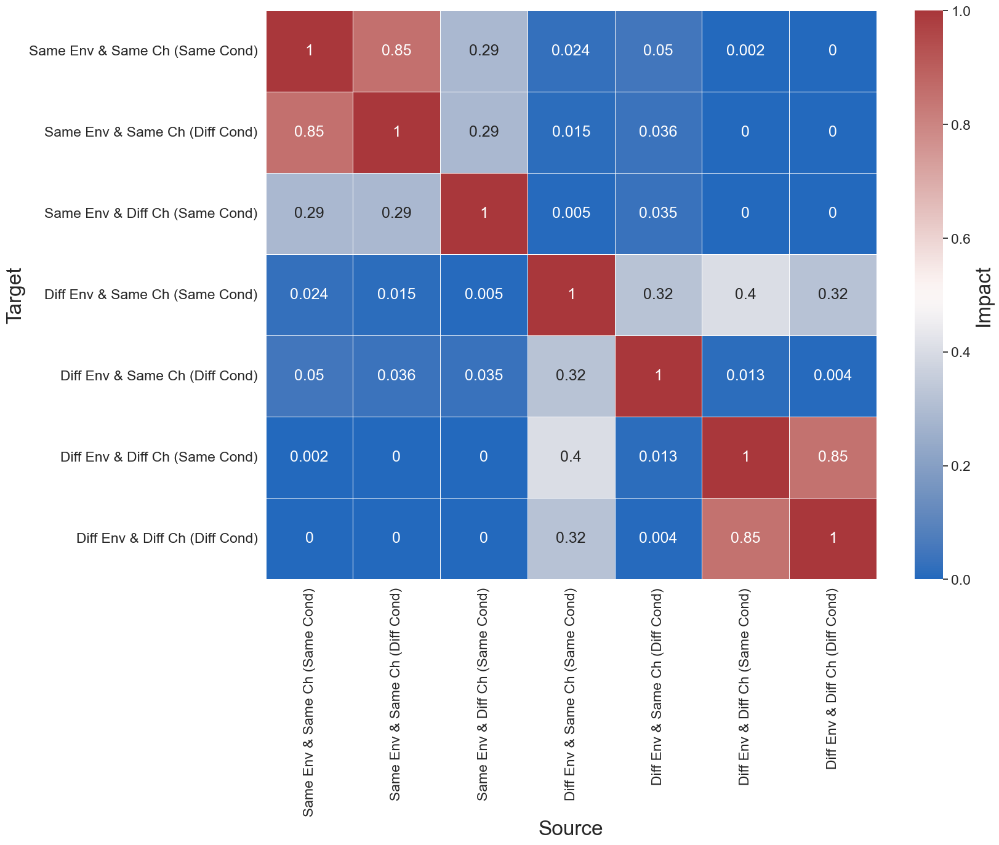

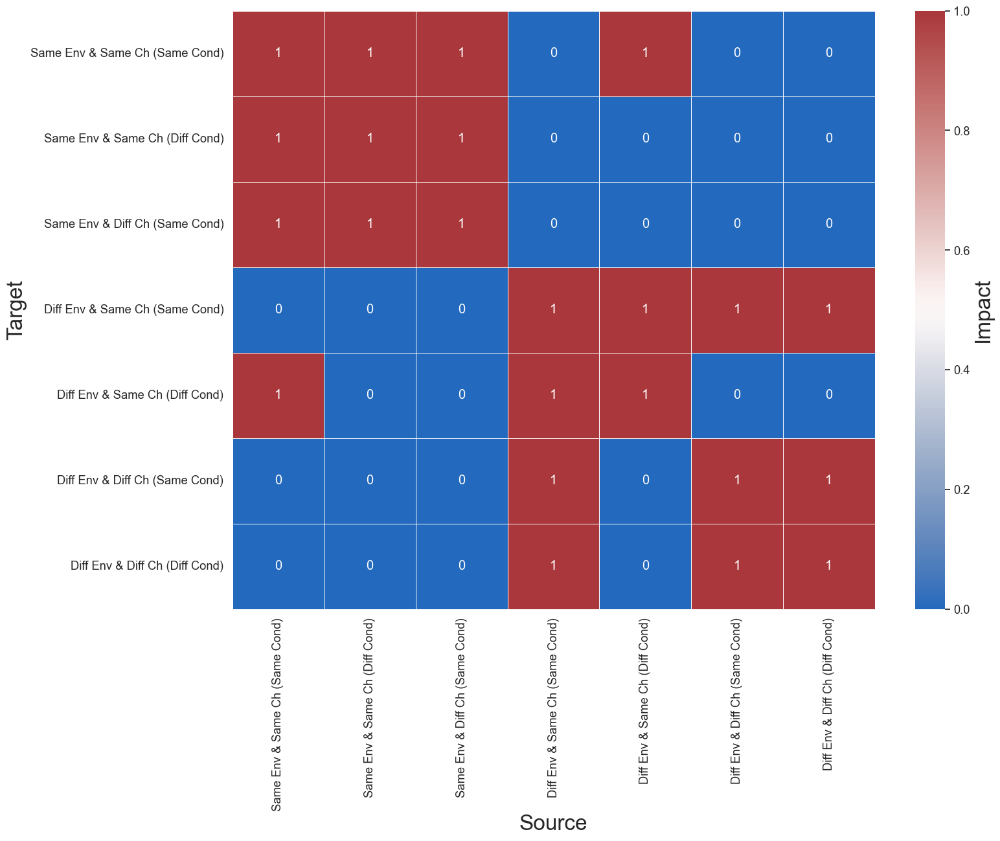

In [17]:
plt.figure(figsize=(16,12))
sns.set(font_scale=1.5)
ax = sns.heatmap(
    np.round(p_mat, 3),
    cmap='vlag',
    linewidths=.5,
    annot=True,
    xticklabels=r_ijs.keys(),
    yticklabels=r_ijs.keys(),
    cbar_kws={'label':'Impact'})
ax.figure.axes[-1].yaxis.label.set_size(24)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Target', fontsize=24)
plt.xlabel('Source', fontsize=24)
plt.show()

plt.figure(figsize=(16,12))
sns.set(font_scale=1.2)
ax = sns.heatmap(
    p_mat > 0.05,
    cmap='vlag',
    linewidths=.5,
    annot=True,
    xticklabels=r_ijs.keys(),
    yticklabels=r_ijs.keys(),
    cbar_kws={'label':'Impact'})
ax.figure.axes[-1].yaxis.label.set_size(24)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Target', fontsize=24)
plt.xlabel('Source', fontsize=24)
plt.show()

In [18]:
vals = []
for k in tf_settings:
    vals.append(sum_r_ijs[k]['mf1'])
    print(f"{k}: {sum_r_ijs[k]['mf1']}")
vals = np.array(vals)[:, np.newaxis]

sum_r_mat = np.concatenate((vals, p_mat), axis=1)
for r in range(sum_r_mat.shape[0]):
    for c in range(sum_r_mat.shape[1]):
        print(sum_r_mat[r,c], end='\t')
    print()

Same Env & Same Ch (Same Cond): 7.346535207757314
Same Env & Same Ch (Diff Cond): 2.710164228480111
Same Env & Diff Ch (Same Cond): 5.2615952325170054
Diff Env & Same Ch (Same Cond): 30.219229654744645
Diff Env & Same Ch (Diff Cond): 12.464201149149071
Diff Env & Diff Ch (Same Cond): 31.545419708399347
Diff Env & Diff Ch (Diff Cond): 25.218737517180873
7.346535207757314	1.0	0.8518148518148518	0.2878653815038254	0.024017262407355286	0.050221385033978744	0.0020548507860155495	0.00034802159827674	
2.710164228480111	0.8518148518148518	1.0	0.28630865701803915	0.015376676986584107	0.035612635339952	0.00034877204474481843	2.455476079979767e-07	
5.2615952325170054	0.2878653815038254	0.28630865701803915	1.0	0.005134982957693888	0.0348589234614956	8.676893719093553e-05	2.866386166314295e-07	
30.219229654744645	0.024017262407355286	0.015376676986584107	0.005134982957693888	1.0	0.32230888448447603	0.40343035572757946	0.3179761769815497	
12.464201149149071	0.050221385033978744	0.035612635339952	0.0

# Transferability of DL model & Affinity Matrix

In [19]:
all_df = df.copy()
df = df.groupby(['source_dataset', 'source_channel', 'target_dataset', 'target_channel']).mean().reset_index()

display(all_df)
display(df)

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,sleepedf,eeg_fpz_cz,isruc,eeg_f4_a1,62.379310,55.497888,78.390805,75.559945,77.666667,74.418389
1,sleepedf,eeg_fpz_cz,mass_ss1,eeg_f4,65.119048,58.118858,81.258503,74.673250,81.054422,73.840610
2,sleepedf,eeg_fpz_cz,mass_ss3,eeg_f4,76.471469,65.112144,86.371125,79.649167,86.520893,79.597216
3,sleepedf,eeg_pz_oz,sleepedf,eeg_fpz_cz,87.025721,67.407124,92.283644,75.949572,92.781015,77.847905
4,sleepedf,eeg_pz_oz,isruc,eeg_f4_a1,58.229885,53.192485,78.402299,75.569593,77.965517,74.982572
...,...,...,...,...,...,...,...,...,...,...
183,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,79.680031,69.860102,80.557994,68.515962,82.255390,73.532491
0,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,81.989924,68.839927,77.824065,66.121768,81.631467,69.985293
1,shhs1_osa,eeg_c4_a1,shhs1_normal,eeg_c4_a1,80.128768,70.103695,81.016486,68.092846,81.035996,72.420823
2,shhs1_normal,eeg_c4_a1,shhs1_osa,eeg_c4_a1,80.982368,67.935635,77.620616,66.040794,83.113738,70.869742


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714
1,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014
2,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373
3,isruc,eeg_c4_a1,mass_ss1,eeg_f4,75.204082,71.195338,81.258503,74.673250,81.921769,77.419974
4,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439
...,...,...,...,...,...,...,...,...,...,...
129,sleepedf,eeg_pz_oz,mass_ss3,eeg_c4,71.903549,63.807158,86.026659,78.738549,87.090010,81.653566
130,sleepedf,eeg_pz_oz,mass_ss3,eeg_f4,68.264191,60.984709,86.386102,79.663805,87.464430,82.304232
131,sleepedf,eeg_pz_oz,shhs1_normal,eeg_c4_a1,69.368842,58.290075,80.538484,68.498365,80.011706,71.008884
132,sleepedf,eeg_pz_oz,shhs1_osa,eeg_c4_a1,61.741910,51.124862,77.620616,66.040794,77.736873,69.632852


In [20]:
# type9 / type6 : transfer (80%) / from scratch (80%)
t1 = 9
t2 = 6
db_30s = ['mass_ss1','mass_ss3','sleepedf','isruc','shhs1_normal','shhs1_osa']
chs = ['eeg_f','eeg_c','eeg_p','eeg_o']
print(f"{type_map[f'type{t1}']} / {type_map[f'type{t2}']}")
for tgt_ds in df['target_dataset'].unique():
    tgt_df = df[df['target_dataset'] == tgt_ds]
    # for tgt_ch in tgt_df['target_channel'].unique():
    for tgt_ch in sorted(tgt_df['target_channel'].unique(), key=cmp_to_key(compare)):
        tgt_ch_df = tgt_df[tgt_df['target_channel'] == tgt_ch].sort_values(by=['source_dataset','source_channel'])
        print(f"Target: {tgt_ds}-{tgt_ch}", end='\t')
        print(tgt_ds)
        if tgt_ds in db_30s:
            list_ds = db_30s
        else:
            raise Exception('Invalid target')
        for src_ds in list_ds:
            for src_ch in chs:
                perf = tgt_ch_df[(tgt_ch_df['source_dataset']==src_ds) & (tgt_ch_df['source_channel'].str.contains(src_ch))]
                if len(perf) == 0:
                    # print(f"  Source: {src_ds:10s}{src_ch:10s} -> NaN")
                    print('NaN', end='\t')
                elif len(perf) == 1:
                    perf = perf.iloc[0].to_dict()
                    acc = perf[f'acc_type{t1}'] / perf[f'acc_type{t2}']
                    mf1 = perf[f'mf1_type{t1}'] / perf[f'mf1_type{t2}']
                    # print(f"  Source: {perf['source_dataset']:10s}{perf['source_channel']:10s} -> acc={acc:.4f}, mf1={mf1:.4f}")
                    print(f'{mf1:.6f}', end='\t')
                else:
                    raise Exception(perf)
        print()
for src_ds in db_30s:
    for src_ch in chs:
        print(f'{src_ds}-{src_ch}', end='\t')
print()

TF_src80-to-tgt80_pred_tgt20 / FS_tgt80_pred_tgt20
Target: isruc-eeg_f4_a1	isruc
1.006726	1.012206	1.023337	1.007400	1.015029	1.023576	1.012477	1.008865	0.984892	NaN	0.992232	NaN	1.026668	1.020461	NaN	0.983459	NaN	1.007461	NaN	NaN	NaN	1.000962	NaN	NaN	
Target: isruc-eeg_c4_a1	isruc
1.002371	1.016472	1.011966	1.013398	1.015222	1.009195	1.022813	1.003060	0.991203	NaN	1.007280	NaN	1.012689	1.018215	NaN	1.006289	NaN	1.015801	NaN	NaN	NaN	1.000931	NaN	NaN	
Target: mass_ss1-eeg_f4	mass_ss1
1.002293	0.994505	1.021397	1.001365	1.010422	1.000305	1.024103	1.014198	0.988850	NaN	0.974145	NaN	1.014561	1.036783	NaN	1.014162	NaN	1.013443	NaN	NaN	NaN	1.026078	NaN	NaN	
Target: mass_ss1-eeg_c4	mass_ss1
0.986903	1.021541	1.022103	1.000812	1.026199	1.046676	1.019197	1.013017	0.976041	NaN	0.987518	NaN	1.005533	1.020844	NaN	0.999416	NaN	1.031037	NaN	NaN	NaN	1.010491	NaN	NaN	
Target: mass_ss3-eeg_f4	mass_ss3
1.031535	1.017002	1.028290	1.030664	0.993166	1.005274	1.026041	1.019659	0.999348	NaN	1.033145	NaN	1.03

TF_src80-to-tgt80_pred_tgt20 / FS_tgt80_pred_tgt20


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
3,isruc,eeg_c4_a1,mass_ss1,eeg_f4,75.204082,71.195338,81.258503,74.67325,81.921769,77.419974
12,isruc,eeg_f4_a1,mass_ss1,eeg_f4,72.227891,68.134682,81.258503,74.67325,81.190476,75.760566
21,isruc,eeg_o2_a1,mass_ss1,eeg_f4,66.904762,62.009818,81.258503,74.67325,81.564626,75.730742
30,mass_ss1,eeg_c4,mass_ss1,eeg_f4,80.170068,75.448537,81.258503,74.67325,80.952381,74.262886
36,mass_ss1,eeg_f3,mass_ss1,eeg_f4,80.901361,73.630996,81.258503,74.67325,81.309524,74.844475
48,mass_ss1,eeg_o2,mass_ss1,eeg_f4,75.340136,68.766154,81.258503,74.67325,81.122449,74.775204
57,mass_ss1,eeg_pz,mass_ss1,eeg_f4,79.047619,72.654758,81.258503,74.67325,81.768707,76.271044
67,mass_ss3,eeg_c4,mass_ss1,eeg_f4,80.850340,74.334447,81.258503,74.67325,82.006803,74.695996
76,mass_ss3,eeg_f4,mass_ss1,eeg_f4,78.520408,70.703226,81.258503,74.67325,81.921769,75.451465
84,mass_ss3,eeg_o2,mass_ss1,eeg_f4,75.153061,68.589149,81.258503,74.67325,81.445578,75.733477


Target: mass_ss1-eeg_f4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

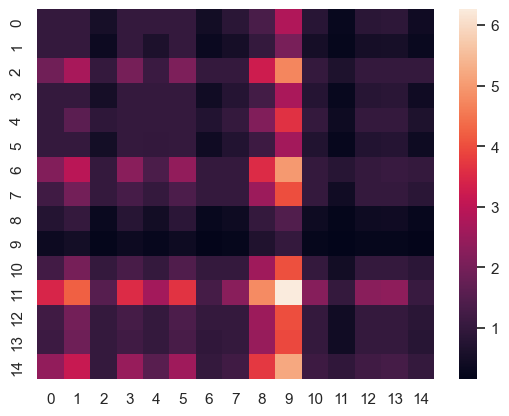

[0.04939696 0.03699351 0.08540943 0.04749294 0.06247132 0.04550193
 0.09219071 0.07126751 0.03032476 0.01828308 0.07205206 0.14731524
 0.07118902 0.0693018  0.10080973]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
2,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373
11,isruc,eeg_f4_a1,mass_ss1,eeg_c4,75.034014,70.671887,80.833333,73.538756,82.363946,73.945672
20,isruc,eeg_o2_a1,mass_ss1,eeg_c4,70.323129,64.891094,80.850340,73.551741,82.125850,73.508821
27,mass_ss1,eeg_c3,mass_ss1,eeg_c4,81.836735,73.484525,80.850340,73.551741,83.214286,75.136126
39,mass_ss1,eeg_f4,mass_ss1,eeg_c4,78.418367,65.008222,80.816327,73.532399,81.904762,72.569348
47,mass_ss1,eeg_o2,mass_ss1,eeg_c4,80.187075,72.208996,80.850340,73.551741,81.887755,73.611459
56,mass_ss1,eeg_pz,mass_ss1,eeg_c4,80.748299,70.602967,80.816327,73.532399,82.074830,75.157702
66,mass_ss3,eeg_c4,mass_ss1,eeg_c4,80.051020,69.025058,80.833333,73.538756,83.979592,76.971283
75,mass_ss3,eeg_f4,mass_ss1,eeg_c4,73.673469,58.860832,80.799320,73.516105,83.299320,75.442167
83,mass_ss3,eeg_o2,mass_ss1,eeg_c4,78.962585,70.258581,80.816327,73.532399,82.857143,74.489561


Target: mass_ss1-eeg_c4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

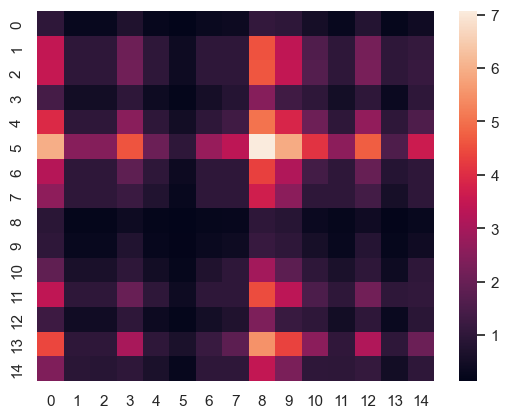

[0.02453314 0.07932164 0.08036869 0.04046245 0.08950275 0.18048885
 0.07447004 0.06317577 0.01833157 0.02511686 0.04777426 0.07790488
 0.03814503 0.10241937 0.0579847 ]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
5,isruc,eeg_c4_a1,mass_ss3,eeg_f4,80.799760,74.943225,86.386102,79.663805,87.853827,82.141815
14,isruc,eeg_f4_a1,mass_ss3,eeg_f4,80.365434,74.820209,86.371125,79.649167,88.303130,82.417438
23,isruc,eeg_o2_a1,mass_ss3,eeg_f4,74.060207,69.834846,86.386102,79.661048,88.153362,83.399301
32,mass_ss1,eeg_c4,mass_ss3,eeg_f4,82.971394,76.848886,86.371125,79.649167,87.449453,81.003333
41,mass_ss1,eeg_f4,mass_ss3,eeg_f4,85.158005,78.583502,86.386102,79.663805,88.003594,82.176025
50,mass_ss1,eeg_o2,mass_ss3,eeg_f4,81.623484,72.674188,86.371125,79.649167,87.674105,82.091538
59,mass_ss1,eeg_pz,mass_ss3,eeg_f4,84.558934,77.009965,86.371125,79.649167,87.614198,81.902440
68,mass_ss3,eeg_c4,mass_ss3,eeg_f4,85.802007,77.256338,86.371125,79.649167,86.775498,80.069232
72,mass_ss3,eeg_f3,mass_ss3,eeg_f4,74.135091,55.641138,86.371125,79.649167,86.236334,79.104844
86,mass_ss3,eeg_o2,mass_ss3,eeg_f4,77.669612,70.391870,86.386102,79.663805,87.344616,81.229949


Target: mass_ss3-eeg_f4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

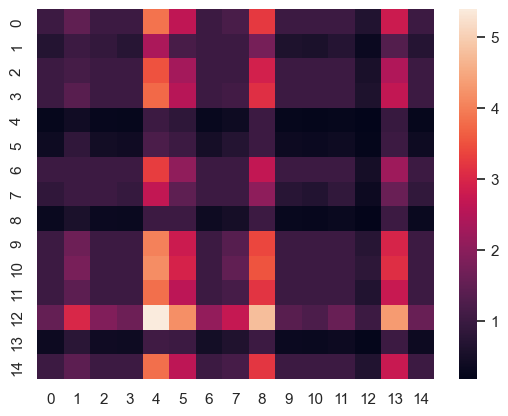

[0.08103333 0.05330218 0.07546627 0.07907104 0.0228347  0.03231211
 0.07284758 0.06136696 0.02675035 0.08411927 0.08698858 0.08023284
 0.1328177  0.03052906 0.08032805]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
4,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439
13,isruc,eeg_f4_a1,mass_ss3,eeg_c4,81.159203,75.607639,86.041635,78.782988,86.266287,80.317055
22,isruc,eeg_o2_a1,mass_ss3,eeg_c4,77.295192,72.540898,86.041635,78.782988,87.060057,81.390586
31,mass_ss1,eeg_c4,mass_ss3,eeg_c4,83.615396,77.660072,86.041635,78.782988,86.865359,81.252809
40,mass_ss1,eeg_f4,mass_ss3,eeg_c4,83.330837,77.071691,86.041635,78.782988,87.209825,80.864528
49,mass_ss1,eeg_o2,mass_ss3,eeg_c4,83.929909,75.538972,86.041635,78.782988,87.134941,81.588815
58,mass_ss1,eeg_pz,mass_ss3,eeg_c4,84.259398,77.350222,86.041635,78.782988,86.670660,80.656923
63,mass_ss3,eeg_c3,mass_ss3,eeg_c4,84.334282,77.915844,86.026659,78.738549,86.341171,80.536650
77,mass_ss3,eeg_f4,mass_ss3,eeg_c4,82.986371,76.091612,86.026659,78.738549,85.083121,79.441726
85,mass_ss3,eeg_o2,mass_ss3,eeg_c4,82.716789,75.343620,86.041635,78.782988,86.910289,80.671189


Target: mass_ss3-eeg_c4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

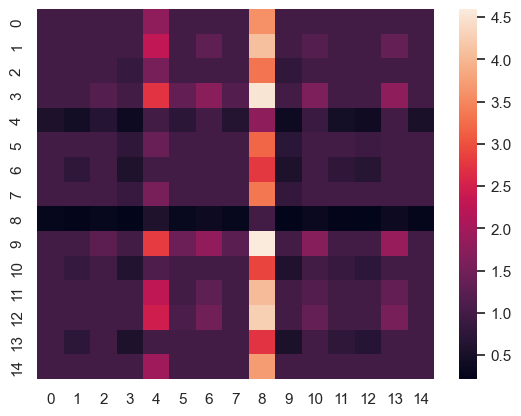

[0.07174513 0.07709198 0.06862777 0.08696542 0.04158474 0.06657685
 0.0594952  0.06883994 0.02014202 0.08940617 0.06156661 0.07664225
 0.08023864 0.05881059 0.07226671]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
8,isruc,eeg_c4_a1,sleepedf,eeg_fpz_cz,41.120743,35.790627,92.283644,75.949572,92.790488,77.352753
17,isruc,eeg_f4_a1,sleepedf,eeg_fpz_cz,74.960921,57.978285,92.283644,75.949572,93.377860,79.007333
26,isruc,eeg_o2_a1,sleepedf,eeg_fpz_cz,39.514945,36.953114,92.283644,75.949572,93.084174,78.266766
35,mass_ss1,eeg_c4,sleepedf,eeg_fpz_cz,36.615982,33.897684,92.283644,75.949572,92.951542,76.099103
44,mass_ss1,eeg_f4,sleepedf,eeg_fpz_cz,40.793899,32.725588,92.283644,75.949572,92.899436,77.324007
53,mass_ss1,eeg_o2,sleepedf,eeg_fpz_cz,42.608119,35.067499,92.283644,75.949572,93.141017,78.051551
62,mass_ss1,eeg_pz,sleepedf,eeg_fpz_cz,44.967079,45.263360,92.283644,75.949572,92.951542,77.905034
71,mass_ss3,eeg_c4,sleepedf,eeg_fpz_cz,49.760788,41.056773,92.283644,75.949572,93.534176,78.138093
80,mass_ss3,eeg_f4,sleepedf,eeg_fpz_cz,35.365449,32.781781,92.283644,75.949572,93.065227,79.025187
89,mass_ss3,eeg_o2,sleepedf,eeg_fpz_cz,37.785988,36.280398,92.283644,75.949572,93.032069,76.194423


Target: sleepedf-eeg_fpz_cz
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: 

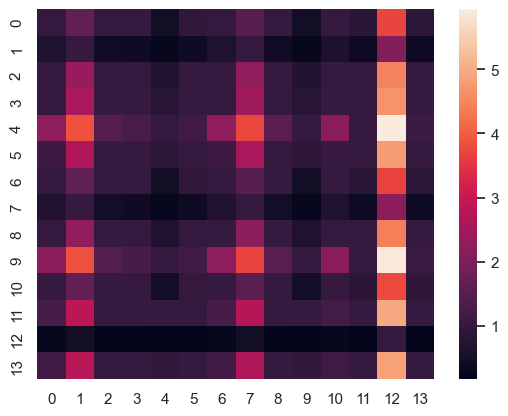

[0.06556342 0.03362734 0.0763792  0.0792006  0.11614278 0.08203889
 0.06510104 0.03533854 0.07539152 0.11500216 0.06645565 0.08756557
 0.0173699  0.08482338]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
1,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014
9,isruc,eeg_f3_a2,isruc,eeg_f4_a1,76.505747,73.727285,78.390805,75.559945,80.505747,77.574969
19,isruc,eeg_o2_a1,isruc,eeg_f4_a1,74.034483,70.663816,78.390805,75.560228,77.034483,74.310409
29,mass_ss1,eeg_c4,isruc,eeg_f4_a1,68.275862,64.086007,78.390805,75.560228,79.804598,76.482537
38,mass_ss1,eeg_f4,isruc,eeg_f4_a1,67.206897,62.347581,78.390805,75.560228,79.908046,76.068439
46,mass_ss1,eeg_o2,isruc,eeg_f4_a1,66.850575,61.953803,78.379310,75.550581,78.632184,76.109653
55,mass_ss1,eeg_pz,isruc,eeg_f4_a1,69.586207,65.086625,78.379310,75.549004,80.195402,77.312085
65,mass_ss3,eeg_c4,isruc,eeg_f4_a1,71.471264,64.535491,78.379310,75.550581,80.919540,77.331727
74,mass_ss3,eeg_f4,isruc,eeg_f4_a1,65.505747,59.760486,78.402299,75.569593,80.068966,76.705308
82,mass_ss3,eeg_o2,isruc,eeg_f4_a1,67.758621,62.617156,78.402299,75.569593,79.655172,76.239526


Target: isruc-eeg_f4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

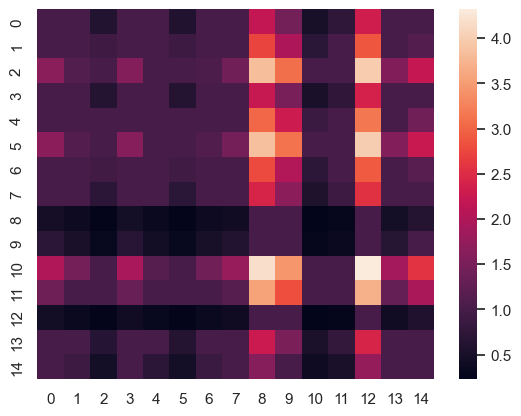

[0.06146874 0.07166367 0.09515047 0.06231222 0.07683918 0.09607914
 0.07257815 0.06524565 0.02706116 0.03541516 0.10835727 0.0873049
 0.02596615 0.0628152  0.05174295]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714
10,isruc,eeg_f4_a1,isruc,eeg_c4_a1,77.241379,74.836806,78.862069,75.665450,79.091954,76.625588
18,isruc,eeg_o2_a1,isruc,eeg_c4_a1,74.666667,71.148883,78.862069,75.662979,78.701149,76.138826
28,mass_ss1,eeg_c4,isruc,eeg_c4_a1,67.712644,63.722099,78.862069,75.662979,79.896552,76.909317
37,mass_ss1,eeg_f4,isruc,eeg_c4_a1,64.287356,58.791990,78.862069,75.665450,79.149425,75.844877
45,mass_ss1,eeg_o2,isruc,eeg_c4_a1,68.505747,63.904064,78.862069,75.662979,79.206897,76.676693
54,mass_ss1,eeg_pz,isruc,eeg_c4_a1,68.678161,64.603197,78.862069,75.662979,79.229885,76.568350
64,mass_ss3,eeg_c4,isruc,eeg_c4_a1,70.597701,63.999835,78.862069,75.665450,79.919540,76.361225
73,mass_ss3,eeg_f4,isruc,eeg_c4_a1,61.620690,55.278606,78.862069,75.665450,80.137931,76.817228
81,mass_ss3,eeg_o2,isruc,eeg_c4_a1,68.655172,63.921883,78.862069,75.665450,80.000000,75.896971


Target: isruc-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

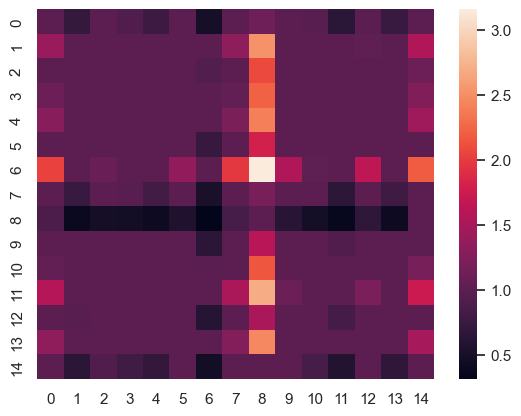

[0.05729455 0.07453985 0.06854401 0.07031772 0.07282096 0.0664874
 0.09025866 0.05872169 0.03668407 0.06505767 0.06949965 0.07811897
 0.06413205 0.07355692 0.05396582]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
6,isruc,eeg_c4_a1,shhs1_normal,eeg_c4_a1,73.885475,65.591308,80.548239,68.505817,81.933470,73.819644
15,isruc,eeg_f4_a1,shhs1_normal,eeg_c4_a1,70.627256,62.146590,80.548239,68.505817,82.021266,73.978722
24,isruc,eeg_o2_a1,shhs1_normal,eeg_c4_a1,71.349137,62.212427,80.538484,68.498365,82.752902,74.188923
33,mass_ss1,eeg_c4,shhs1_normal,eeg_c4_a1,65.232660,54.935862,80.548239,68.505817,80.401912,69.990066
42,mass_ss1,eeg_f4,shhs1_normal,eeg_c4_a1,65.115598,52.277840,80.548239,68.505817,81.748122,72.735207
51,mass_ss1,eeg_o2,shhs1_normal,eeg_c4_a1,67.076383,57.291082,80.548239,68.505817,80.840894,72.789594
60,mass_ss1,eeg_pz,shhs1_normal,eeg_c4_a1,65.154619,53.754678,80.548239,68.505817,82.255390,73.016195
69,mass_ss3,eeg_c4,shhs1_normal,eeg_c4_a1,67.690957,57.126684,80.557994,68.515962,80.518974,72.837116
78,mass_ss3,eeg_f4,shhs1_normal,eeg_c4_a1,58.208955,46.902988,80.557994,68.515962,82.196859,74.970156
87,mass_ss3,eeg_o2,shhs1_normal,eeg_c4_a1,66.061848,57.634005,80.548239,68.505817,80.860404,71.863796


Target: shhs1_normal-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With sourc

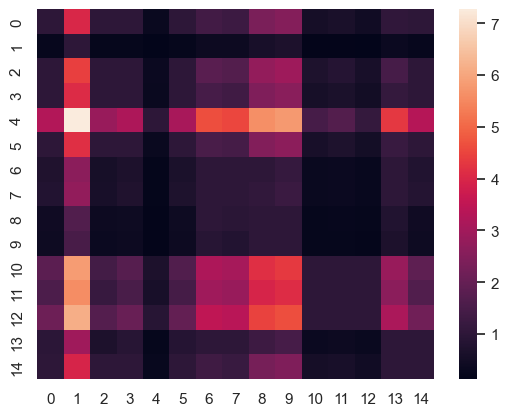

[0.05865154 0.01648596 0.0679066  0.06029673 0.16965845 0.06178264
 0.03758023 0.03940052 0.02793834 0.02610391 0.10984126 0.10117538
 0.12196489 0.04392496 0.05728861]


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
7,isruc,eeg_c4_a1,shhs1_osa,eeg_c4_a1,69.095137,63.673850,77.630304,66.047461,80.556094,71.411182
16,isruc,eeg_f4_a1,shhs1_osa,eeg_c4_a1,68.281341,63.139441,77.630304,66.047461,82.890913,73.828987
25,isruc,eeg_o2_a1,shhs1_osa,eeg_c4_a1,69.676419,63.753685,77.630304,66.043766,82.639023,74.130076
34,mass_ss1,eeg_c4,shhs1_osa,eeg_c4_a1,62.013176,53.857971,77.630304,66.043766,80.585158,70.746963
43,mass_ss1,eeg_f4,shhs1_osa,eeg_c4_a1,65.442744,52.683766,77.620616,66.040794,81.650843,72.238238
52,mass_ss1,eeg_o2,shhs1_osa,eeg_c4_a1,68.426661,58.401818,77.620616,66.040794,82.290254,73.118957
61,mass_ss1,eeg_pz,shhs1_osa,eeg_c4_a1,63.873280,53.216814,77.620616,66.040794,82.028677,72.924815
70,mass_ss3,eeg_c4,shhs1_osa,eeg_c4_a1,67.293160,55.982269,77.620616,66.040794,83.385003,74.107738
79,mass_ss3,eeg_f4,shhs1_osa,eeg_c4_a1,61.499709,49.607084,77.620616,66.040794,80.730479,72.182605
88,mass_ss3,eeg_o2,shhs1_osa,eeg_c4_a1,68.814183,60.693702,77.639992,66.053712,79.180391,70.921945


Target: shhs1_osa-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: 

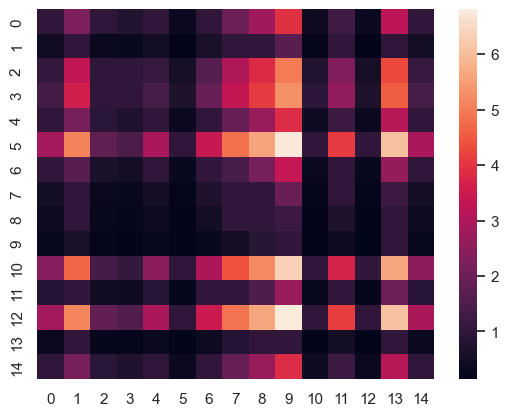

[0.06091571 0.02797564 0.08387048 0.09526484 0.0589992  0.1482195
 0.05012062 0.0303419  0.02410951 0.01770517 0.13247595 0.04003405
 0.14948114 0.02149406 0.05899222]


OrderedDict([('mass_ss1-eeg_f4',
              {'src': ['mass_ss1-eeg_f3',
                'mass_ss1-eeg_c4',
                'mass_ss1-eeg_pz',
                'mass_ss1-eeg_o2',
                'mass_ss3-eeg_f4',
                'mass_ss3-eeg_c4',
                'mass_ss3-eeg_pz',
                'mass_ss3-eeg_o2',
                'sleepedf-eeg_fpz_cz',
                'sleepedf-eeg_pz_oz',
                'isruc-eeg_f4_a1',
                'isruc-eeg_c4_a1',
                'isruc-eeg_o2_a1',
                'shhs1_normal-eeg_c4_a1',
                'shhs1_osa-eeg_c4_a1'],
               'eigenvector': array([0.04939696, 0.03699351, 0.08540943, 0.04749294, 0.06247132,
                      0.04550193, 0.09219071, 0.07126751, 0.03032476, 0.01828308,
                      0.07205206, 0.14731524, 0.07118902, 0.0693018 , 0.10080973])}),
             ('mass_ss1-eeg_c4',
              {'src': ['mass_ss1-eeg_f4',
                'mass_ss1-eeg_c3',
                'mass_ss1-eeg_pz',
      

Target: mass_ss1-eeg_f4
Target: mass_ss1-eeg_c4
Target: mass_ss3-eeg_f4
Target: mass_ss3-eeg_c4
Target: sleepedf-eeg_fpz_cz
Target: isruc-eeg_f4_a1
Target: isruc-eeg_c4_a1
Target: shhs1_normal-eeg_c4_a1
Target: shhs1_osa-eeg_c4_a1


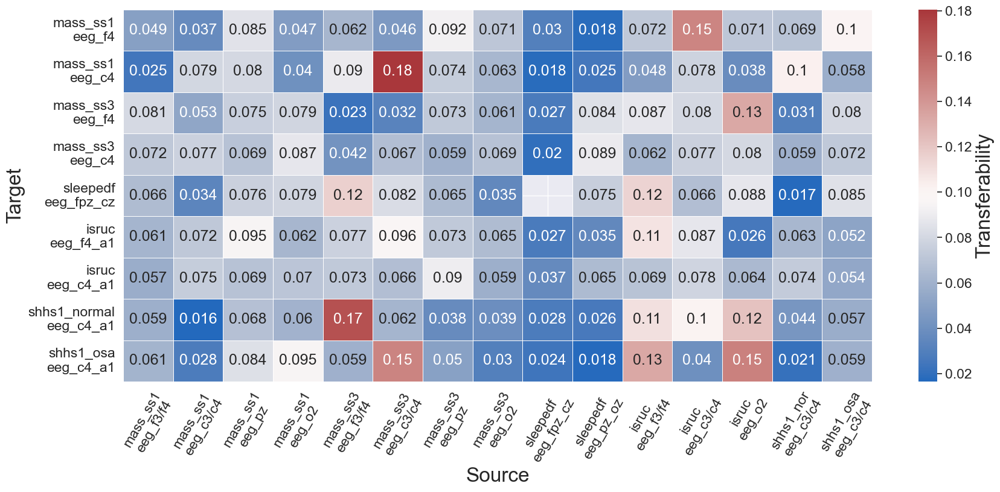

Usefulness


,name,value
10,isruc-eeg_f3/f4,0.089284
5,mass_ss3-eeg_c3/c4,0.086610
12,isruc-eeg_o2,0.085722
11,isruc-eeg_c3/c4,0.083909
4,mass_ss3-eeg_f3/f4,0.078984
2,mass_ss1-eeg_pz,0.077969
3,mass_ss1-eeg_o2,0.069043
14,shhs1_osa-eeg_c3/c4,0.068689
6,mass_ss3-eeg_pz,0.068294
0,mass_ss1-eeg_f3/f4,0.058956


/Users/akara/miniconda3/envs/sleep_tf/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


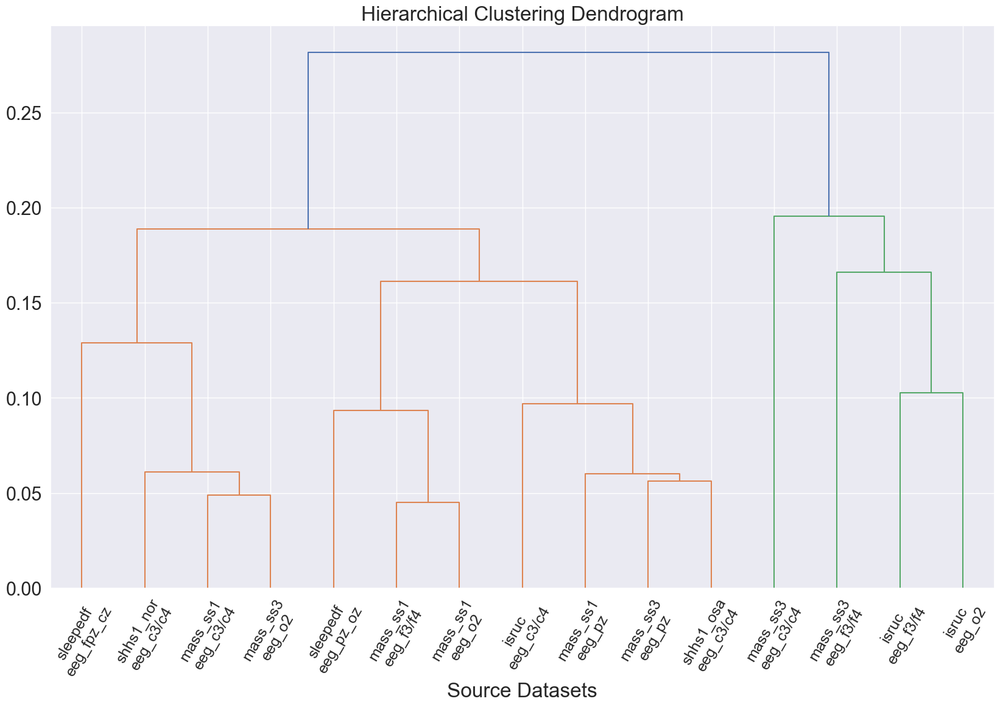

In [21]:
import seaborn as sns; sns.set_theme()
import numpy as np

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering

# type9 / type6
t1 = 9
t2 = 6
db_30s = ['mass_ss1','mass_ss3','sleepedf','isruc','shhs1_normal','shhs1_osa']
db_20s = ['mass_ss2','mass_ss4','mass_ss5']
chs = ['eeg_f','eeg_c','eeg_p','eeg_o']
print(f"{type_map[f'type{t1}']} / {type_map[f'type{t2}']}")

#### Affinity matrix ####

# target_ds = df['target_dataset'].unique()
target_ds = [
    'mass_ss1', 'mass_ss3',
    'sleepedf', 'isruc',
    'shhs1_normal','shhs1_osa',
    'mass_ss2', 'mass_ss4', 'mass_ss5']
tfability = OrderedDict()
for tgt_ds in target_ds:
    tgt_df = df[df['target_dataset'] == tgt_ds]
    # for tgt_ch in tgt_df['target_channel'].unique():
    for tgt_ch in sorted(tgt_df['target_channel'].unique(), key=cmp_to_key(compare)):
        tgt_ch_df = tgt_df[tgt_df['target_channel'] == tgt_ch].sort_values(by=['source_dataset','source_channel'])
        perf_mf1_type_t2 = tgt_ch_df[['target_dataset','target_channel',f'mf1_type{t1}',f'mf1_type{t2}']] \
                    .groupby(by=['target_dataset','target_channel']).mean() \
                    .reset_index().iloc[0].to_dict()[f'mf1_type{t2}']
        display(tgt_ch_df)
        # display(tgt_ch_df[['target_dataset','target_channel',f'mf1_type{t1}',f'mf1_type{t2}']]
        #             .groupby(by=['target_dataset','target_channel']).mean()
        #             .reset_index().iloc[0].to_dict()[f'mf1_type{t2}'])
        print(f"Target: {tgt_ds}-{tgt_ch}")
        if tgt_ds in db_30s:
            list_ds = db_30s
        else:
            list_ds = db_20s
        i = 0
        aff_mat = np.zeros((len(list_ds)*len(chs),len(list_ds)*len(chs)))
        src_list = []
        nan_src_list = []
        for src_ds in list_ds:
            for src_ch in chs:
                perf = tgt_ch_df[(tgt_ch_df['source_dataset']==src_ds) & (tgt_ch_df['source_channel'].str.contains(src_ch))]
                if len(perf) == 1:
                    print(f'Comparing source: {src_ds}-{src_ch}')
                    # display(perf)
                    perf = perf.iloc[0].to_dict()
                    if tgt_ds == 'mass_ss1':
                        mf1 = perf[f'mf1_type{t1}'] / perf[f'mf1_type{t2}']
                    else:
                        mf1 = perf[f'mf1_type{t1}'] / perf_mf1_type_t2
                    j = 0
                    for _src_ds in list_ds:
                        for _src_ch in chs:
                            if i == j:
                                aff_mat[i,j] = 1
                            else:
                                _perf = tgt_ch_df[(tgt_ch_df['source_dataset']==_src_ds) & (tgt_ch_df['source_channel'].str.contains(_src_ch))]
                                if len(_perf) == 1:
                                    print(f'With source: {_src_ds}-{_src_ch}')
                                    # display(_perf)
                                    _perf = _perf.iloc[0].to_dict()
                                    if tgt_ds == 'mass_ss1':
                                        _mf1 = _perf[f'mf1_type{t1}'] / _perf[f'mf1_type{t2}']
                                    else:
                                        _mf1 = _perf[f'mf1_type{t1}'] / perf_mf1_type_t2
                                    diff = (mf1 - _mf1) * 100
                                    if diff >= 1:
                                        # greater
                                        aff_mat[i,j] = diff
                                    elif diff <= -1:
                                        # less
                                        aff_mat[i,j] = 1. / abs(diff)
                                    else:
                                        # equal or less than 1 percent better
                                        aff_mat[i,j] = 1
                                    # if aff_mat[i,j] >= 5:
                                    #     print(perf[f'mf1_type{t1}'], perf[f'mf1_type{t2}'], _perf[f'mf1_type{t1}'], _perf[f'mf1_type{t2}'])
                                    #     print(src_ds, src_ch, _src_ds, _src_ch, aff_mat[i,j], mf1, _mf1)
                                else:
                                    aff_mat[i,j] = float('nan')
                            j += 1
                    src_list.append(f"{perf['source_dataset']}-{perf['source_channel']}")
                else:
                    aff_mat[i,:] = float('nan')
                    nan_src_list.append(f"{src_ds}-{src_ch}")
                i += 1
        # Heatmap
        nan_src = np.where(np.isnan(aff_mat).all(axis=0))[0]
        print(f"Not available source: {nan_src_list} {nan_src}")
        aff_mat = aff_mat[~np.isnan(aff_mat).all(axis=0)]
        aff_mat = aff_mat[:,~np.all(np.isnan(aff_mat), axis=0)]
        ax = sns.heatmap(aff_mat)
        plt.show()

        # Estimate eigenvector (not exact calculation)
        sum_cols = np.sum(aff_mat, axis=0)
        norm_aff_mat = aff_mat / sum_cols
        est_eigenvectors = np.sum(norm_aff_mat, axis=1) / norm_aff_mat.shape[1]
        print(est_eigenvectors)

        tfability[f'{tgt_ds}-{tgt_ch}'] = {}
        tfability[f'{tgt_ds}-{tgt_ch}']['src'] = src_list
        tfability[f'{tgt_ds}-{tgt_ch}']['eigenvector'] = est_eigenvectors

display(tfability)

#### Affinity matrix - 30s ####

y_ticklabels = []
x_ticklabels = None
tf_mat = []
for k in tfability:
    print(f'Target: {k}')
    db, ch = k.split('-')
    if db in db_30s:
        if len(tfability[k]['eigenvector']) == 15:
            ev = np.array(tfability[k]['eigenvector'])
            tf_mat.append(ev)
            if x_ticklabels is None:
                x_ticklabels = [_.replace('-','\n') for _ in tfability[k]['src']]
                for _i, _x in enumerate(x_ticklabels):
                    if 'eeg_f3' in _x:
                        _x = _x.replace('eeg_f3','eeg_f3/f4')
                    elif 'eeg_f4' in _x:
                        _x = _x.replace('eeg_f4','eeg_f3/f4')
                    elif 'eeg_c3' in _x:
                        _x = _x.replace('eeg_c4','eeg_c3/c4')
                    elif 'eeg_c4' in _x:
                        _x = _x.replace('eeg_c4','eeg_c3/c4')
                    x_ticklabels[_i] = _x.replace('_a1', '').replace('_a2', '').replace('_normal','_nor')
            y_ticklabels.append(k.replace('-','\n'))
        elif len(tfability[k]['eigenvector']) == 14:
            ev = np.array(tfability[k]['eigenvector'])
            ev = np.insert(ev, -6, float('nan'))  # insert sleepedf-fpz
            tf_mat.append(ev)
            y_ticklabels.append(k.replace('-','\n'))
tf_mat = np.array(tf_mat)

plt.figure(figsize=(20,8))
sns.set(font_scale=1.5)
ax = sns.heatmap(
    tf_mat,
    cmap='vlag',
    linewidths=.5,
    annot=True,
    xticklabels=x_ticklabels,
    yticklabels=y_ticklabels,
    cbar_kws={'label':'Transferability'})
ax.figure.axes[-1].yaxis.label.set_size(24)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.ylabel('Target', fontsize=24)
plt.xlabel('Source', fontsize=24)
plt.show()

print('Usefulness')
useful_df = pd.DataFrame({
    'name': [t.replace('\n','-') for t in x_ticklabels],
    'value': np.nanmean(tf_mat, axis=0),
})
# for v, t in zip(np.nanmean(tf_mat, axis=0), x_ticklabels):
#     tt = t.replace('\n','-')
#     print(f"{tt}: {v}")
display(useful_df.sort_values(by='value',ascending=False))

#### plot dendrogram ####

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(
    distance_threshold=0,
    affinity='euclidean',
    linkage='ward',
    # affinity='cosine',
    # linkage='average',
    n_clusters=None)

model = model.fit(np.nan_to_num(tf_mat).T)
# plot the top three levels of the dendrogram
plt.figure(figsize=(20,12))
sns.set(font_scale=2)
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(
    model,
    truncate_mode='level',
    leaf_rotation=60,
    leaf_font_size=18,
    labels=x_ticklabels,
    p=6)
plt.xlabel("Source Datasets")
plt.show()

Target: mass_ss1-eeg_f4
Target: mass_ss1-eeg_c4
Target: mass_ss3-eeg_f4
Target: mass_ss3-eeg_c4
Target: sleepedf-eeg_fpz_cz
Target: isruc-eeg_f4_a1
Target: isruc-eeg_c4_a1
Target: shhs1_normal-eeg_c4_a1
Target: shhs1_osa-eeg_c4_a1
['mass_ss1\neeg_f3/f4', 'mass_ss1\neeg_c3/c4', 'mass_ss1\neeg_pz', 'mass_ss1\neeg_o2', 'mass_ss3\neeg_f3/f4', 'mass_ss3\neeg_c3/c4', 'mass_ss3\neeg_pz', 'mass_ss3\neeg_o2', 'sleepedf\neeg_fpz_cz', 'sleepedf\neeg_pz_oz', 'isruc\neeg_f3/f4', 'isruc\neeg_c3/c4', 'isruc\neeg_o2', 'shhs1_nor\neeg_c3/c4', 'shhs1_osa\neeg_c3/c4']
['mass_ss1\neeg_f4', 'mass_ss1\neeg_c4', 'mass_ss3\neeg_f4', 'mass_ss3\neeg_c4', 'sleepedf\neeg_fpz_cz', 'isruc\neeg_f4_a1', 'isruc\neeg_c4_a1', 'shhs1_normal\neeg_c4_a1', 'shhs1_osa\neeg_c4_a1']
Usefulness


/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/1300778103.py:71: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


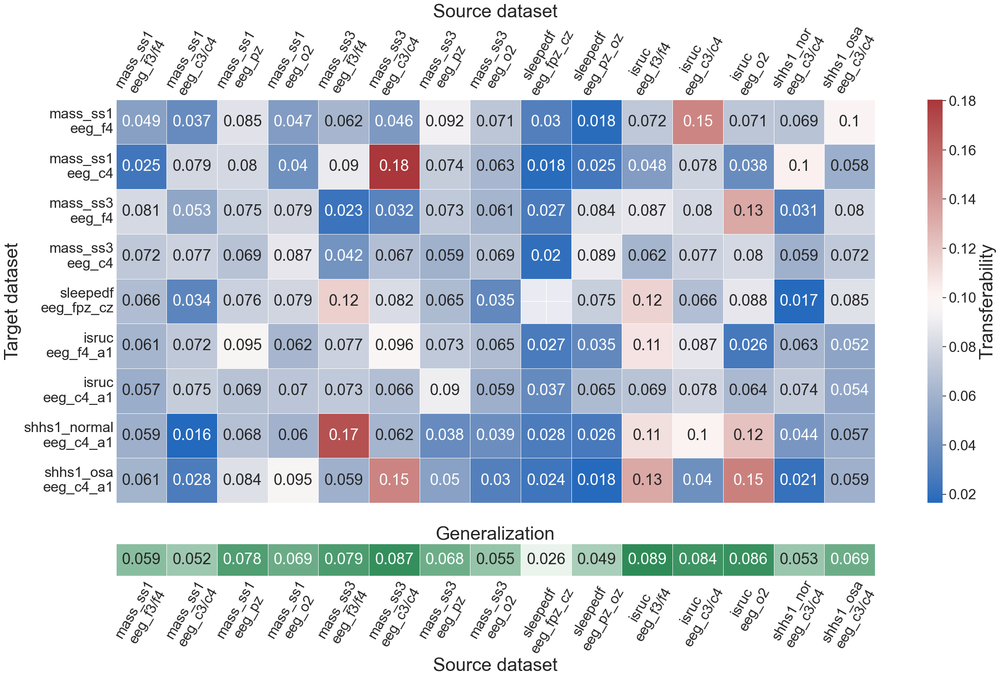

In [22]:
#### Affinity matrix - 30s ####

y_ticklabels = []
x_ticklabels = None
tf_mat = []
for k in tfability:
    print(f'Target: {k}')
    db, ch = k.split('-')
    if db in db_30s:
        if len(tfability[k]['eigenvector']) == 15:
            ev = np.array(tfability[k]['eigenvector'])
            tf_mat.append(ev)
            if x_ticklabels is None:
                x_ticklabels = [_.replace('-','\n') for _ in tfability[k]['src']]
                for _i, _x in enumerate(x_ticklabels):
                    if 'eeg_f3' in _x:
                        _x = _x.replace('eeg_f3','eeg_f3/f4')
                    elif 'eeg_f4' in _x:
                        _x = _x.replace('eeg_f4','eeg_f3/f4')
                    elif 'eeg_c3' in _x:
                        _x = _x.replace('eeg_c4','eeg_c3/c4')
                    elif 'eeg_c4' in _x:
                        _x = _x.replace('eeg_c4','eeg_c3/c4')
                    x_ticklabels[_i] = _x.replace('_a1', '').replace('_a2', '').replace('_normal','_nor')
            y_ticklabels.append(k.replace('-','\n'))
        elif len(tfability[k]['eigenvector']) == 14:
            ev = np.array(tfability[k]['eigenvector'])
            ev = np.insert(ev, -6, float('nan'))  # insert sleepedf-fpz
            tf_mat.append(ev)
            y_ticklabels.append(k.replace('-','\n'))
tf_mat = np.array(tf_mat)

print(x_ticklabels)
print(y_ticklabels)

print('Usefulness')
useful_df = pd.DataFrame({
    'name': [t.replace('\n','-') for t in x_ticklabels],
    'value': np.nanmean(tf_mat, axis=0),
})
# # for v, t in zip(np.nanmean(tf_mat, axis=0), x_ticklabels):
# #     tt = t.replace('\n','-')
# #     print(f"{tt}: {v}")
# display(useful_df.sort_values(by='value',ascending=False))


# for publication
label_size = 30
sns.set(font_scale=2.1)
gs_kw = dict(width_ratios=[1,0.02], height_ratios=[1,0.08])
f, axs = plt.subplots(ncols=2, nrows=2, figsize=(20,12), gridspec_kw=gs_kw)
axs[1,1].remove()
f.tight_layout()
axs[0,0].get_shared_y_axes().join(axs[1,0])
ax = sns.heatmap(
    tf_mat,
    cmap='vlag',
    xticklabels=x_ticklabels,
    yticklabels=y_ticklabels,
    linewidths=.5,
    annot=True,
    cbar_ax=axs[0,1],
    # cbar_kws={'label':r'$h^{t}_{(i,j)}$'},
    ax=axs[0,0])
axs[0,0].set_yticklabels(axs[0,0].get_yticklabels(), rotation=0)
axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=60)
axs[0,0].xaxis.tick_top()
axs[0,0].xaxis.set_label_position('top')
axs[0,0].tick_params(length=0)
axs[0,0].set_xlabel(f'Source dataset', fontsize=label_size)
axs[0,0].set_ylabel(f'Target dataset', fontsize=label_size)
axs[0,1].set_ylabel('Transferability', fontsize=label_size)

ax = sns.heatmap(
    [useful_df['value'].values],
    cmap=sns.light_palette("seagreen", as_cmap=True),
    xticklabels=x_ticklabels,
    yticklabels=[""],
    linewidths=.5,
    cbar=False,
    annot=True,
    ax=axs[1,0])
axs[1,0].set_yticklabels(axs[1,0].get_yticklabels(), rotation=0)
axs[1,0].set_xticklabels(axs[1,0].get_xticklabels(), rotation=60)
axs[1,0].tick_params(length=0)
axs[1,0].set_xlabel(f'Source dataset', fontsize=label_size)
axs[1,0].set_title(f'Generalization', fontsize=label_size)

plt.savefig(f'tf_mat_utime.eps', format='eps', dpi=500, bbox_inches='tight')
plt.show()
plt.close('all')

TF_src80-to-tgt80_pred_tgt20 / FS_tgt80_pred_tgt20


,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
3,isruc,eeg_c4_a1,mass_ss1,eeg_f4,75.204082,71.195338,81.258503,74.67325,81.921769,77.419974
12,isruc,eeg_f4_a1,mass_ss1,eeg_f4,72.227891,68.134682,81.258503,74.67325,81.190476,75.760566
21,isruc,eeg_o2_a1,mass_ss1,eeg_f4,66.904762,62.009818,81.258503,74.67325,81.564626,75.730742
30,mass_ss1,eeg_c4,mass_ss1,eeg_f4,80.170068,75.448537,81.258503,74.67325,80.952381,74.262886
36,mass_ss1,eeg_f3,mass_ss1,eeg_f4,80.901361,73.630996,81.258503,74.67325,81.309524,74.844475
48,mass_ss1,eeg_o2,mass_ss1,eeg_f4,75.340136,68.766154,81.258503,74.67325,81.122449,74.775204
57,mass_ss1,eeg_pz,mass_ss1,eeg_f4,79.047619,72.654758,81.258503,74.67325,81.768707,76.271044
67,mass_ss3,eeg_c4,mass_ss1,eeg_f4,80.850340,74.334447,81.258503,74.67325,82.006803,74.695996
76,mass_ss3,eeg_f4,mass_ss1,eeg_f4,78.520408,70.703226,81.258503,74.67325,81.921769,75.451465
84,mass_ss3,eeg_o2,mass_ss1,eeg_f4,75.153061,68.589149,81.258503,74.67325,81.445578,75.733477


Target: mass_ss1-eeg_f4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


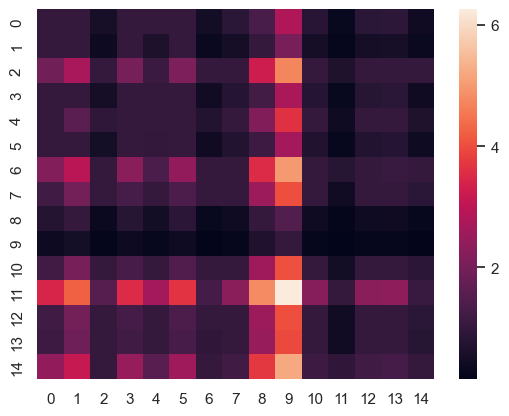

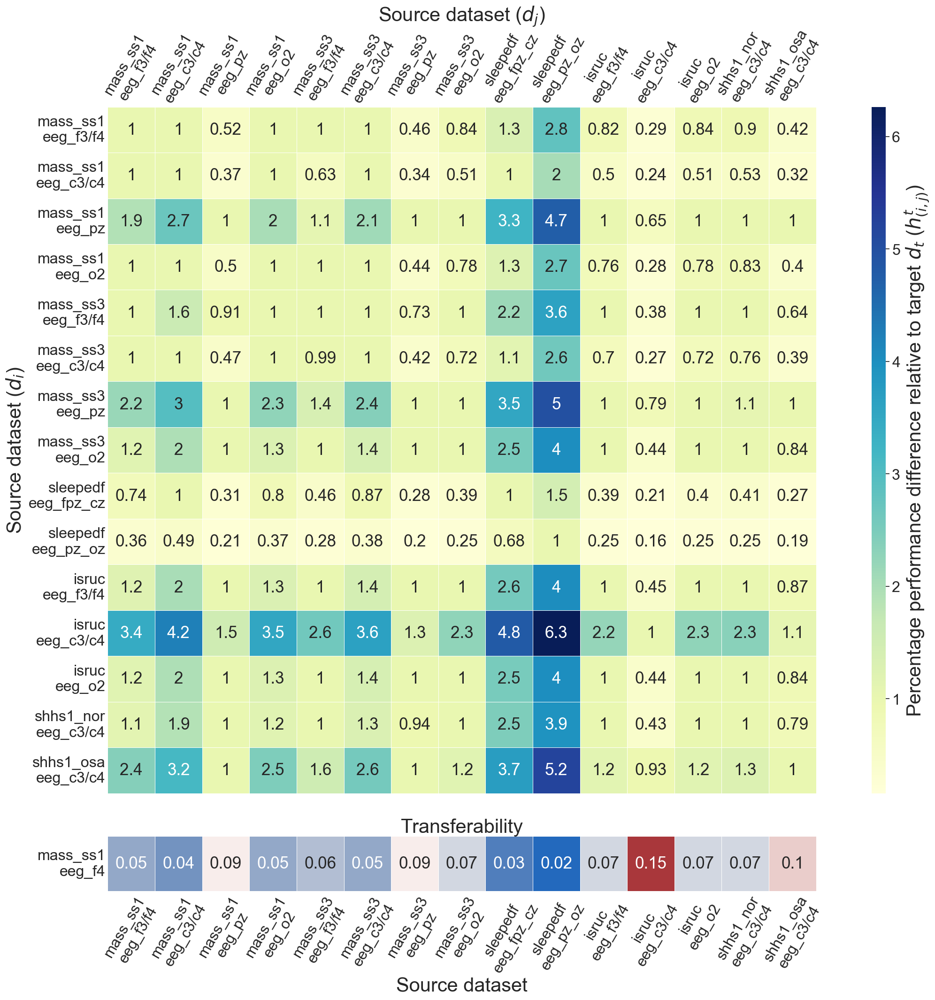

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
2,isruc,eeg_c4_a1,mass_ss1,eeg_c4,76.700680,72.568550,80.833333,73.545395,82.755102,75.078373
11,isruc,eeg_f4_a1,mass_ss1,eeg_c4,75.034014,70.671887,80.833333,73.538756,82.363946,73.945672
20,isruc,eeg_o2_a1,mass_ss1,eeg_c4,70.323129,64.891094,80.850340,73.551741,82.125850,73.508821
27,mass_ss1,eeg_c3,mass_ss1,eeg_c4,81.836735,73.484525,80.850340,73.551741,83.214286,75.136126
39,mass_ss1,eeg_f4,mass_ss1,eeg_c4,78.418367,65.008222,80.816327,73.532399,81.904762,72.569348
47,mass_ss1,eeg_o2,mass_ss1,eeg_c4,80.187075,72.208996,80.850340,73.551741,81.887755,73.611459
56,mass_ss1,eeg_pz,mass_ss1,eeg_c4,80.748299,70.602967,80.816327,73.532399,82.074830,75.157702
66,mass_ss3,eeg_c4,mass_ss1,eeg_c4,80.051020,69.025058,80.833333,73.538756,83.979592,76.971283
75,mass_ss3,eeg_f4,mass_ss1,eeg_c4,73.673469,58.860832,80.799320,73.516105,83.299320,75.442167
83,mass_ss3,eeg_o2,mass_ss1,eeg_c4,78.962585,70.258581,80.816327,73.532399,82.857143,74.489561


Target: mass_ss1-eeg_c4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


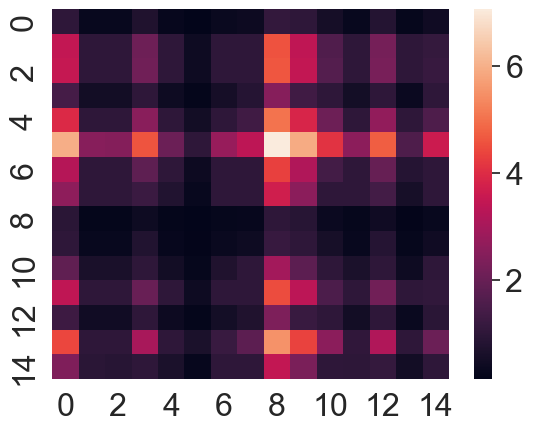

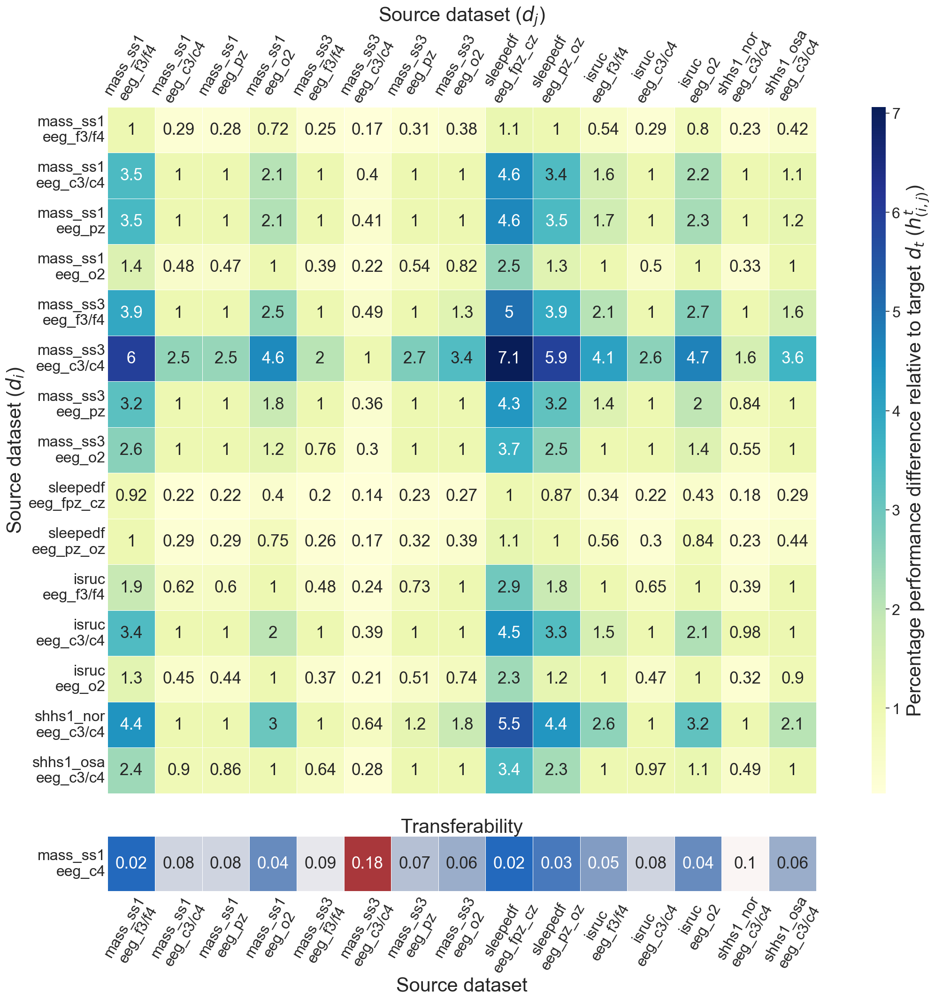

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
5,isruc,eeg_c4_a1,mass_ss3,eeg_f4,80.799760,74.943225,86.386102,79.663805,87.853827,82.141815
14,isruc,eeg_f4_a1,mass_ss3,eeg_f4,80.365434,74.820209,86.371125,79.649167,88.303130,82.417438
23,isruc,eeg_o2_a1,mass_ss3,eeg_f4,74.060207,69.834846,86.386102,79.661048,88.153362,83.399301
32,mass_ss1,eeg_c4,mass_ss3,eeg_f4,82.971394,76.848886,86.371125,79.649167,87.449453,81.003333
41,mass_ss1,eeg_f4,mass_ss3,eeg_f4,85.158005,78.583502,86.386102,79.663805,88.003594,82.176025
50,mass_ss1,eeg_o2,mass_ss3,eeg_f4,81.623484,72.674188,86.371125,79.649167,87.674105,82.091538
59,mass_ss1,eeg_pz,mass_ss3,eeg_f4,84.558934,77.009965,86.371125,79.649167,87.614198,81.902440
68,mass_ss3,eeg_c4,mass_ss3,eeg_f4,85.802007,77.256338,86.371125,79.649167,86.775498,80.069232
72,mass_ss3,eeg_f3,mass_ss3,eeg_f4,74.135091,55.641138,86.371125,79.649167,86.236334,79.104844
86,mass_ss3,eeg_o2,mass_ss3,eeg_f4,77.669612,70.391870,86.386102,79.663805,87.344616,81.229949


Target: mass_ss3-eeg_f4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


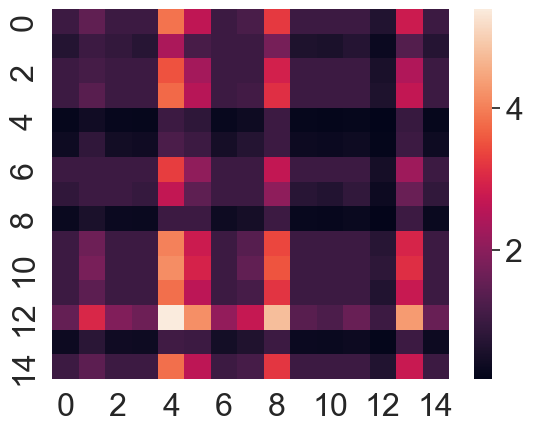

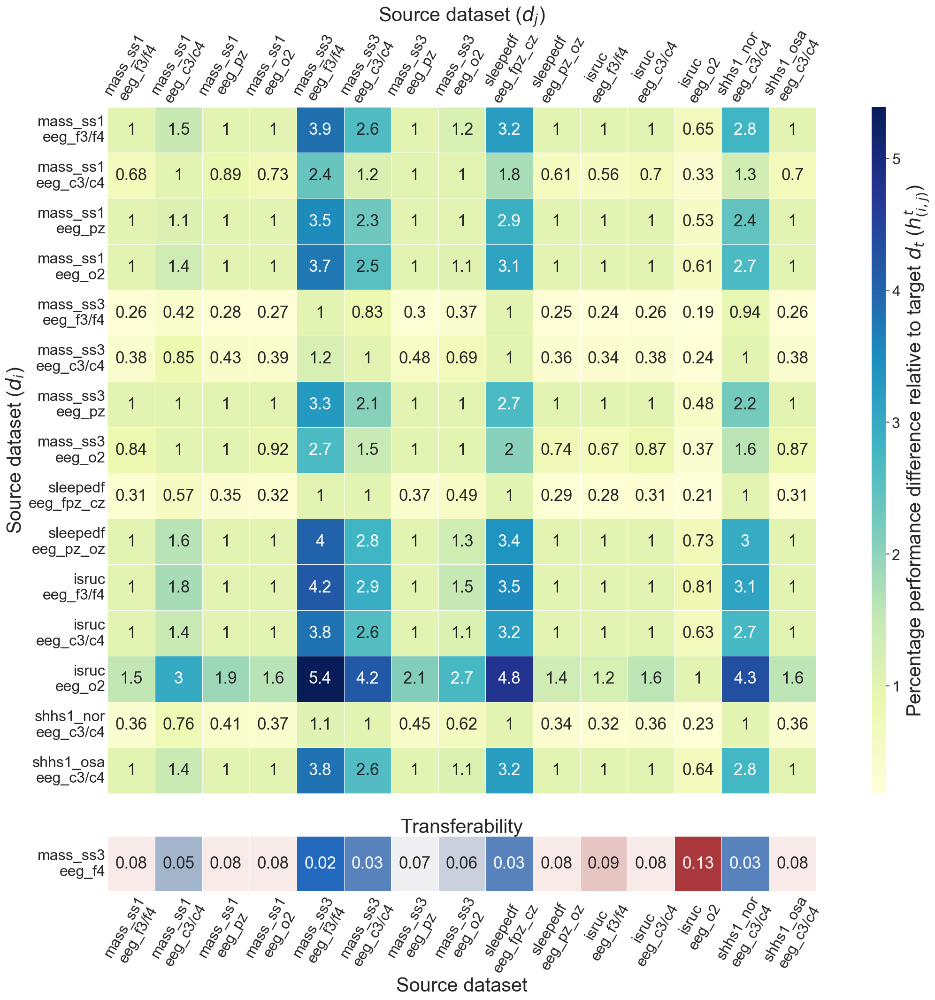

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
4,isruc,eeg_c4_a1,mass_ss3,eeg_c4,82.297439,76.928123,86.026659,78.738549,87.045080,81.230439
13,isruc,eeg_f4_a1,mass_ss3,eeg_c4,81.159203,75.607639,86.041635,78.782988,86.266287,80.317055
22,isruc,eeg_o2_a1,mass_ss3,eeg_c4,77.295192,72.540898,86.041635,78.782988,87.060057,81.390586
31,mass_ss1,eeg_c4,mass_ss3,eeg_c4,83.615396,77.660072,86.041635,78.782988,86.865359,81.252809
40,mass_ss1,eeg_f4,mass_ss3,eeg_c4,83.330837,77.071691,86.041635,78.782988,87.209825,80.864528
49,mass_ss1,eeg_o2,mass_ss3,eeg_c4,83.929909,75.538972,86.041635,78.782988,87.134941,81.588815
58,mass_ss1,eeg_pz,mass_ss3,eeg_c4,84.259398,77.350222,86.041635,78.782988,86.670660,80.656923
63,mass_ss3,eeg_c3,mass_ss3,eeg_c4,84.334282,77.915844,86.026659,78.738549,86.341171,80.536650
77,mass_ss3,eeg_f4,mass_ss3,eeg_c4,82.986371,76.091612,86.026659,78.738549,85.083121,79.441726
85,mass_ss3,eeg_o2,mass_ss3,eeg_c4,82.716789,75.343620,86.041635,78.782988,86.910289,80.671189


Target: mass_ss3-eeg_c4
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


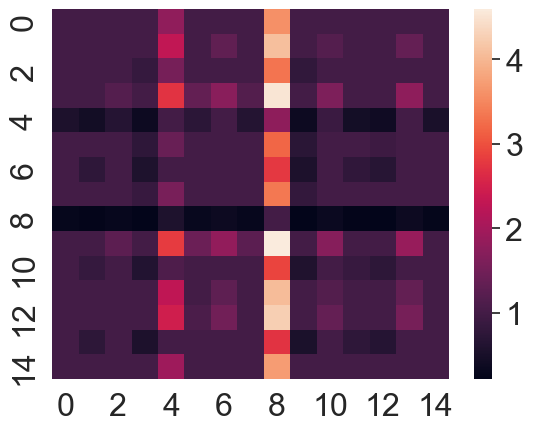

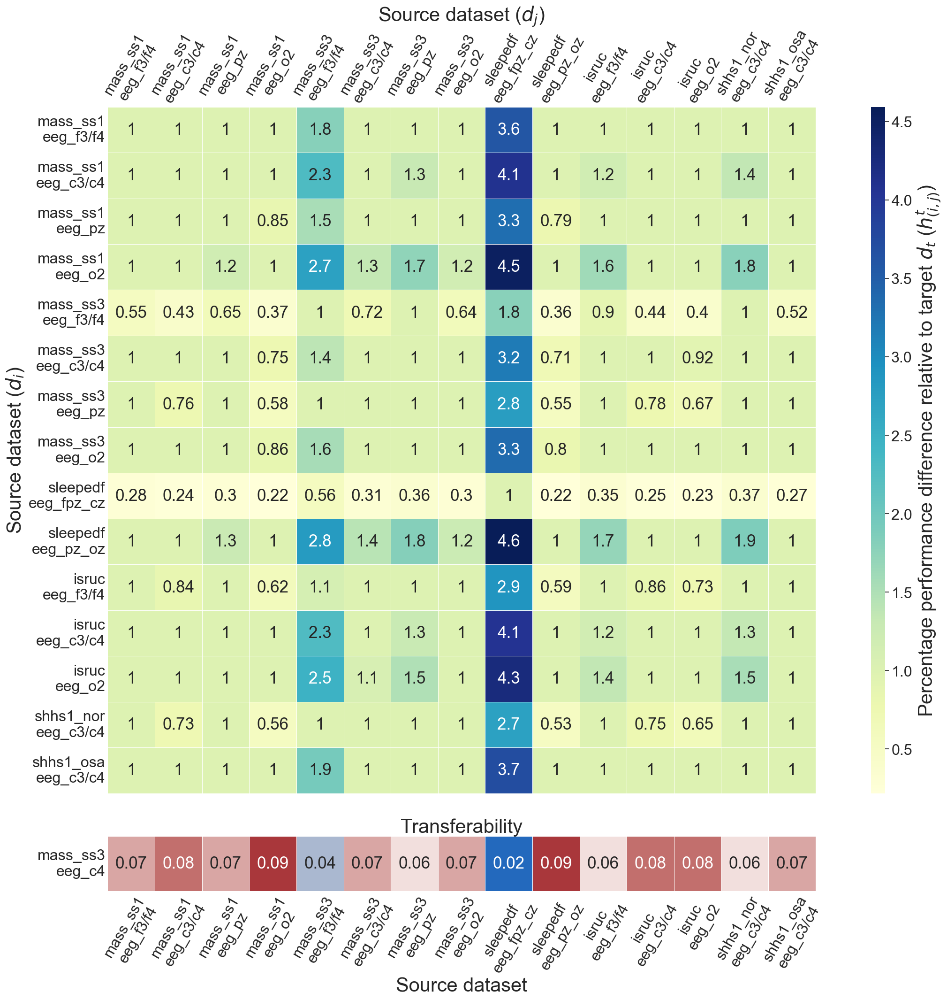

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
8,isruc,eeg_c4_a1,sleepedf,eeg_fpz_cz,41.120743,35.790627,92.283644,75.949572,92.790488,77.352753
17,isruc,eeg_f4_a1,sleepedf,eeg_fpz_cz,74.960921,57.978285,92.283644,75.949572,93.377860,79.007333
26,isruc,eeg_o2_a1,sleepedf,eeg_fpz_cz,39.514945,36.953114,92.283644,75.949572,93.084174,78.266766
35,mass_ss1,eeg_c4,sleepedf,eeg_fpz_cz,36.615982,33.897684,92.283644,75.949572,92.951542,76.099103
44,mass_ss1,eeg_f4,sleepedf,eeg_fpz_cz,40.793899,32.725588,92.283644,75.949572,92.899436,77.324007
53,mass_ss1,eeg_o2,sleepedf,eeg_fpz_cz,42.608119,35.067499,92.283644,75.949572,93.141017,78.051551
62,mass_ss1,eeg_pz,sleepedf,eeg_fpz_cz,44.967079,45.263360,92.283644,75.949572,92.951542,77.905034
71,mass_ss3,eeg_c4,sleepedf,eeg_fpz_cz,49.760788,41.056773,92.283644,75.949572,93.534176,78.138093
80,mass_ss3,eeg_f4,sleepedf,eeg_fpz_cz,35.365449,32.781781,92.283644,75.949572,93.065227,79.025187
89,mass_ss3,eeg_o2,sleepedf,eeg_fpz_cz,37.785988,36.280398,92.283644,75.949572,93.032069,76.194423


Target: sleepedf-eeg_fpz_cz
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: 

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


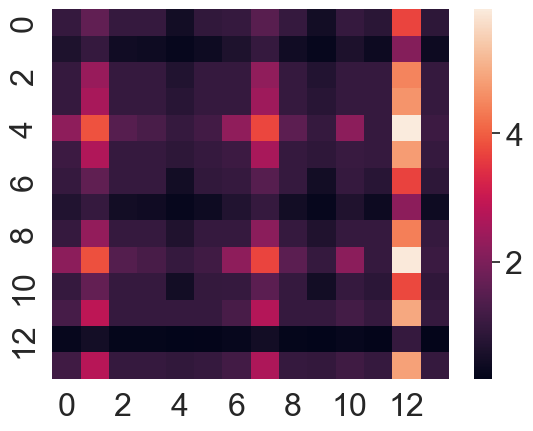

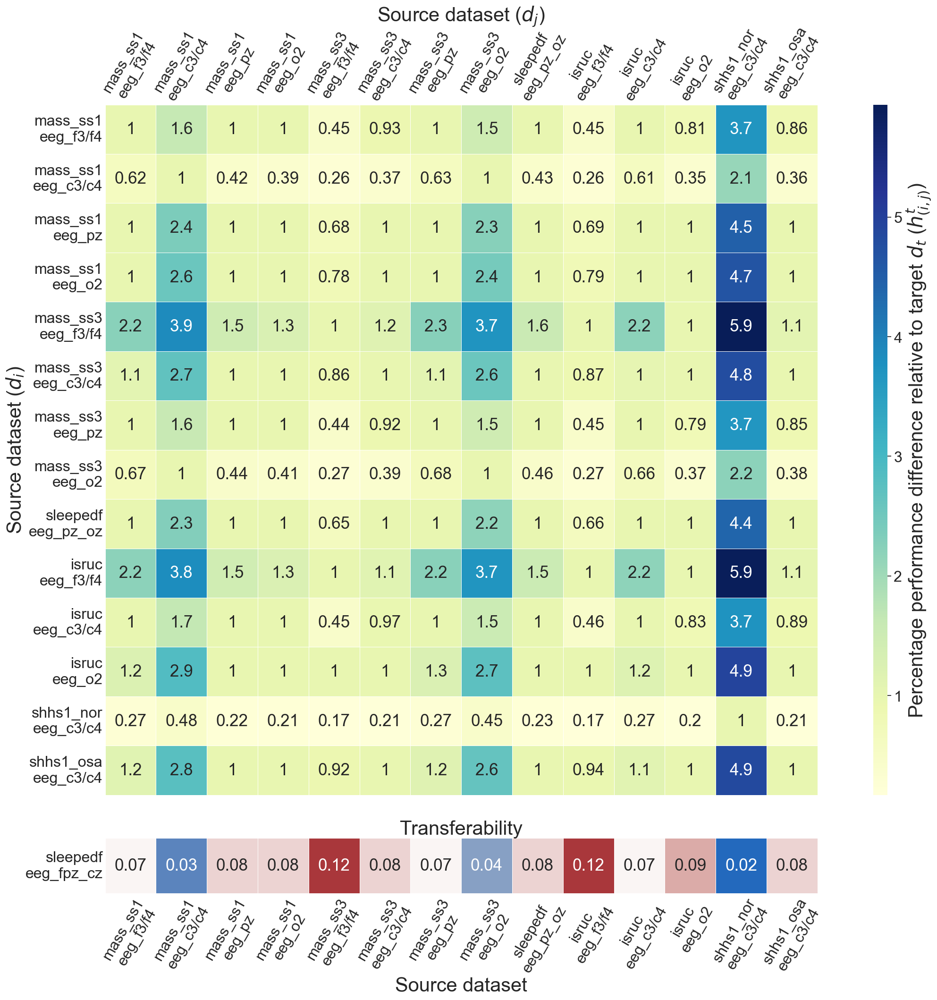

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
1,isruc,eeg_c4_a1,isruc,eeg_f4_a1,78.988506,75.262676,78.390805,75.559945,79.781609,77.106014
9,isruc,eeg_f3_a2,isruc,eeg_f4_a1,76.505747,73.727285,78.390805,75.559945,80.505747,77.574969
19,isruc,eeg_o2_a1,isruc,eeg_f4_a1,74.034483,70.663816,78.390805,75.560228,77.034483,74.310409
29,mass_ss1,eeg_c4,isruc,eeg_f4_a1,68.275862,64.086007,78.390805,75.560228,79.804598,76.482537
38,mass_ss1,eeg_f4,isruc,eeg_f4_a1,67.206897,62.347581,78.390805,75.560228,79.908046,76.068439
46,mass_ss1,eeg_o2,isruc,eeg_f4_a1,66.850575,61.953803,78.379310,75.550581,78.632184,76.109653
55,mass_ss1,eeg_pz,isruc,eeg_f4_a1,69.586207,65.086625,78.379310,75.549004,80.195402,77.312085
65,mass_ss3,eeg_c4,isruc,eeg_f4_a1,71.471264,64.535491,78.379310,75.550581,80.919540,77.331727
74,mass_ss3,eeg_f4,isruc,eeg_f4_a1,65.505747,59.760486,78.402299,75.569593,80.068966,76.705308
82,mass_ss3,eeg_o2,isruc,eeg_f4_a1,67.758621,62.617156,78.402299,75.569593,79.655172,76.239526


Target: isruc-eeg_f4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


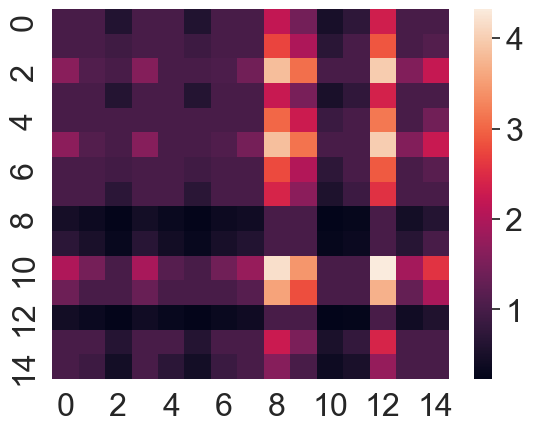

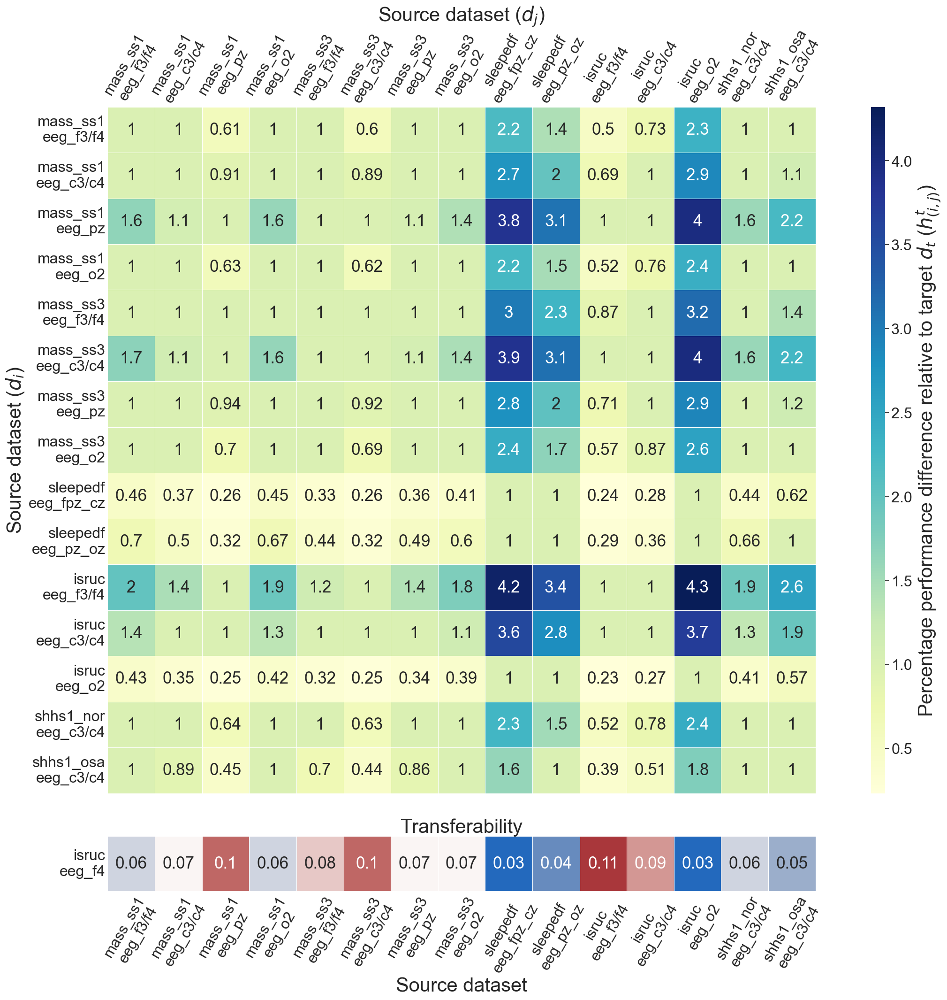

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
0,isruc,eeg_c3_a2,isruc,eeg_c4_a1,75.988506,72.532522,78.862069,75.665450,80.632184,77.043714
10,isruc,eeg_f4_a1,isruc,eeg_c4_a1,77.241379,74.836806,78.862069,75.665450,79.091954,76.625588
18,isruc,eeg_o2_a1,isruc,eeg_c4_a1,74.666667,71.148883,78.862069,75.662979,78.701149,76.138826
28,mass_ss1,eeg_c4,isruc,eeg_c4_a1,67.712644,63.722099,78.862069,75.662979,79.896552,76.909317
37,mass_ss1,eeg_f4,isruc,eeg_c4_a1,64.287356,58.791990,78.862069,75.665450,79.149425,75.844877
45,mass_ss1,eeg_o2,isruc,eeg_c4_a1,68.505747,63.904064,78.862069,75.662979,79.206897,76.676693
54,mass_ss1,eeg_pz,isruc,eeg_c4_a1,68.678161,64.603197,78.862069,75.662979,79.229885,76.568350
64,mass_ss3,eeg_c4,isruc,eeg_c4_a1,70.597701,63.999835,78.862069,75.665450,79.919540,76.361225
73,mass_ss3,eeg_f4,isruc,eeg_c4_a1,61.620690,55.278606,78.862069,75.665450,80.137931,76.817228
81,mass_ss3,eeg_o2,isruc,eeg_c4_a1,68.655172,63.921883,78.862069,75.665450,80.000000,75.896971


Target: isruc-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: mass

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


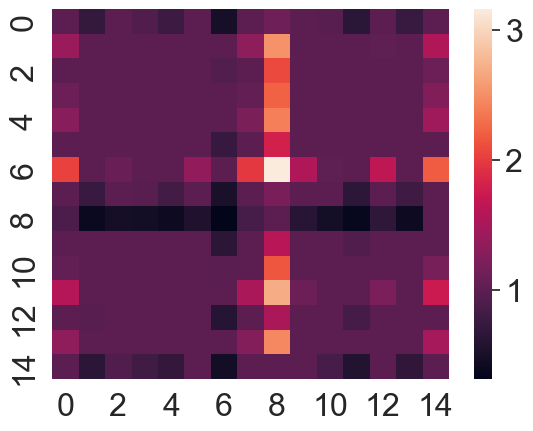

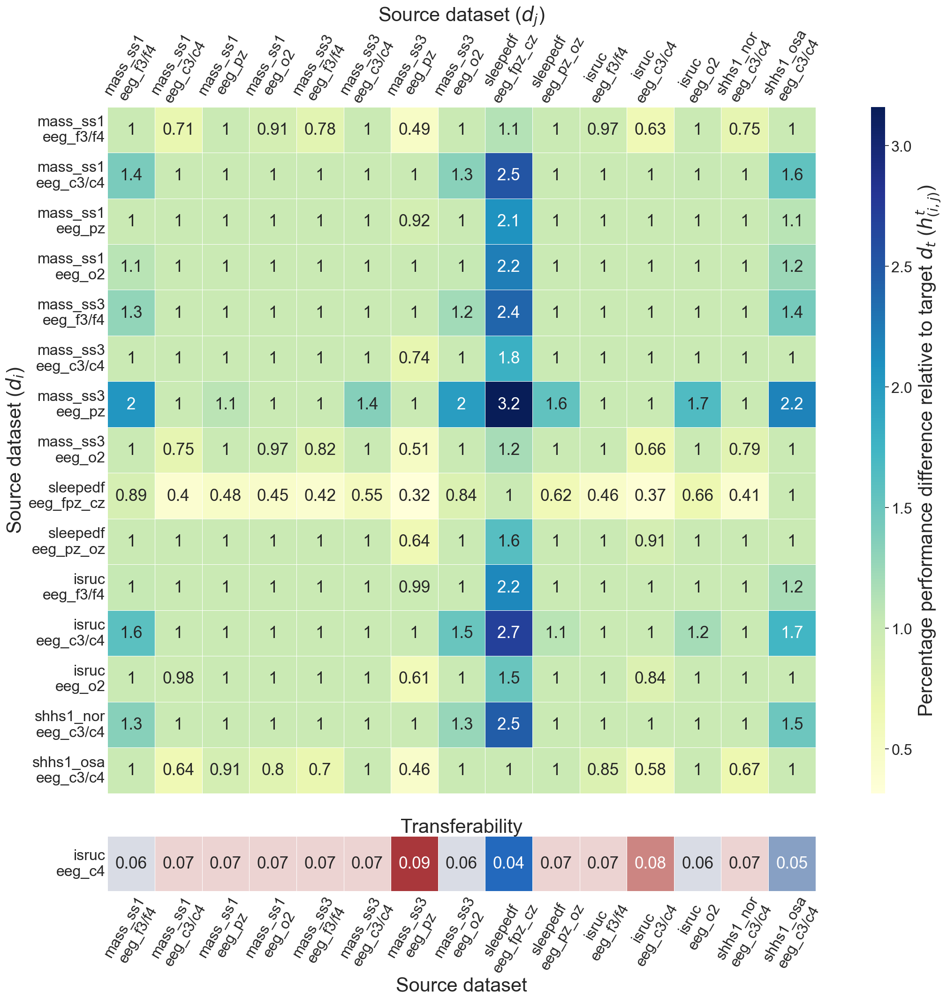

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
6,isruc,eeg_c4_a1,shhs1_normal,eeg_c4_a1,73.885475,65.591308,80.548239,68.505817,81.933470,73.819644
15,isruc,eeg_f4_a1,shhs1_normal,eeg_c4_a1,70.627256,62.146590,80.548239,68.505817,82.021266,73.978722
24,isruc,eeg_o2_a1,shhs1_normal,eeg_c4_a1,71.349137,62.212427,80.538484,68.498365,82.752902,74.188923
33,mass_ss1,eeg_c4,shhs1_normal,eeg_c4_a1,65.232660,54.935862,80.548239,68.505817,80.401912,69.990066
42,mass_ss1,eeg_f4,shhs1_normal,eeg_c4_a1,65.115598,52.277840,80.548239,68.505817,81.748122,72.735207
51,mass_ss1,eeg_o2,shhs1_normal,eeg_c4_a1,67.076383,57.291082,80.548239,68.505817,80.840894,72.789594
60,mass_ss1,eeg_pz,shhs1_normal,eeg_c4_a1,65.154619,53.754678,80.548239,68.505817,82.255390,73.016195
69,mass_ss3,eeg_c4,shhs1_normal,eeg_c4_a1,67.690957,57.126684,80.557994,68.515962,80.518974,72.837116
78,mass_ss3,eeg_f4,shhs1_normal,eeg_c4_a1,58.208955,46.902988,80.557994,68.515962,82.196859,74.970156
87,mass_ss3,eeg_o2,shhs1_normal,eeg_c4_a1,66.061848,57.634005,80.548239,68.505817,80.860404,71.863796


Target: shhs1_normal-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With sourc

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


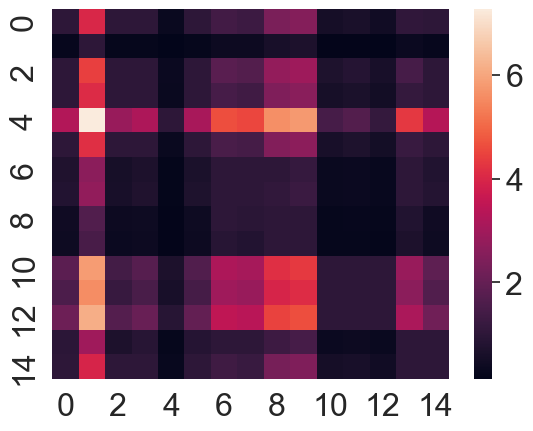

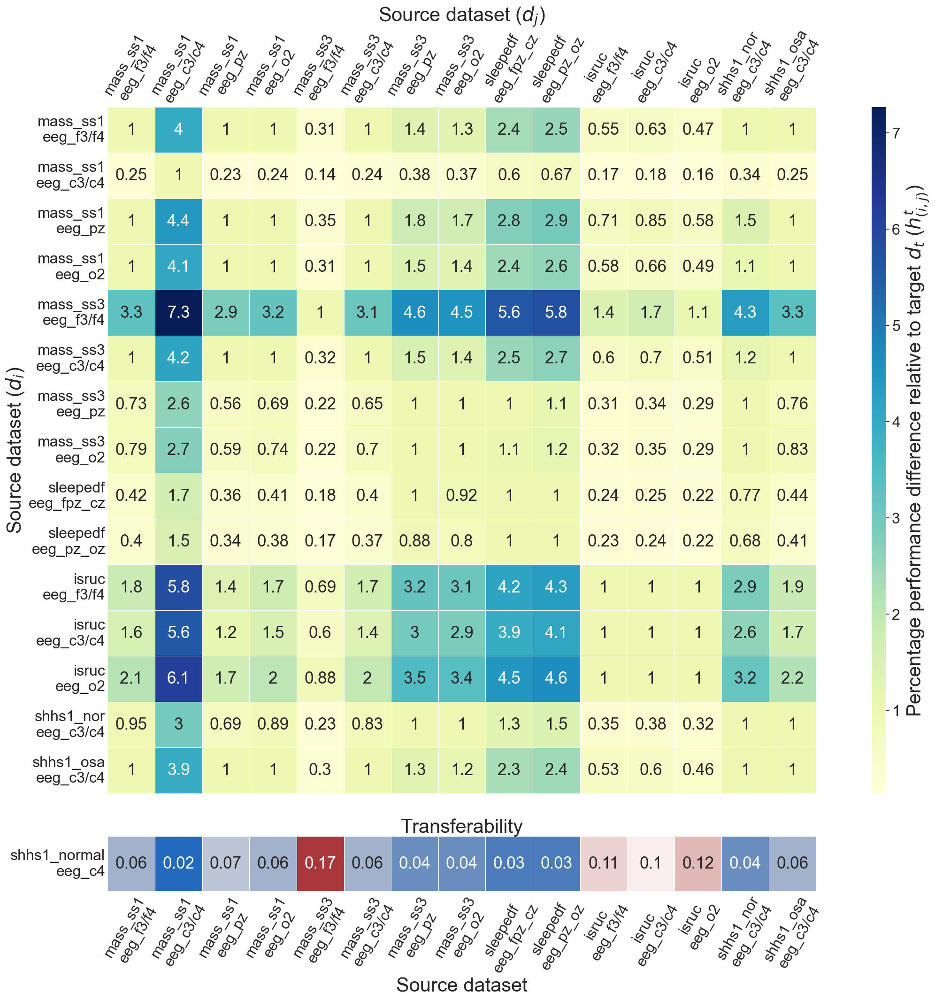

,source_dataset,source_channel,target_dataset,target_channel,acc_type3,mf1_type3,acc_type6,mf1_type6,acc_type9,mf1_type9
7,isruc,eeg_c4_a1,shhs1_osa,eeg_c4_a1,69.095137,63.673850,77.630304,66.047461,80.556094,71.411182
16,isruc,eeg_f4_a1,shhs1_osa,eeg_c4_a1,68.281341,63.139441,77.630304,66.047461,82.890913,73.828987
25,isruc,eeg_o2_a1,shhs1_osa,eeg_c4_a1,69.676419,63.753685,77.630304,66.043766,82.639023,74.130076
34,mass_ss1,eeg_c4,shhs1_osa,eeg_c4_a1,62.013176,53.857971,77.630304,66.043766,80.585158,70.746963
43,mass_ss1,eeg_f4,shhs1_osa,eeg_c4_a1,65.442744,52.683766,77.620616,66.040794,81.650843,72.238238
52,mass_ss1,eeg_o2,shhs1_osa,eeg_c4_a1,68.426661,58.401818,77.620616,66.040794,82.290254,73.118957
61,mass_ss1,eeg_pz,shhs1_osa,eeg_c4_a1,63.873280,53.216814,77.620616,66.040794,82.028677,72.924815
70,mass_ss3,eeg_c4,shhs1_osa,eeg_c4_a1,67.293160,55.982269,77.620616,66.040794,83.385003,74.107738
79,mass_ss3,eeg_f4,shhs1_osa,eeg_c4_a1,61.499709,49.607084,77.620616,66.040794,80.730479,72.182605
88,mass_ss3,eeg_o2,shhs1_osa,eeg_c4_a1,68.814183,60.693702,77.639992,66.053712,79.180391,70.921945


Target: shhs1_osa-eeg_c4_a1
Comparing source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_c
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_p
With source: mass_ss1-eeg_o
With source: mass_ss3-eeg_f
With source: mass_ss3-eeg_c
With source: mass_ss3-eeg_p
With source: mass_ss3-eeg_o
With source: sleepedf-eeg_f
With source: sleepedf-eeg_p
With source: isruc-eeg_f
With source: isruc-eeg_c
With source: isruc-eeg_o
With source: shhs1_normal-eeg_c
With source: shhs1_osa-eeg_c
Comparing source: mass_ss1-eeg_p
With source: mass_ss1-eeg_f
With source: mass_ss1-eeg_c
With source: mass_ss1-eeg_o
With source: 

/var/folders/nb/9lsbxq3s3x976rmt497ftw_00000gp/T/ipykernel_46024/3876289023.py:128: MatplotlibDeprecationWarning: The join function was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  axs[0,0].get_shared_y_axes().join(axs[1,0])


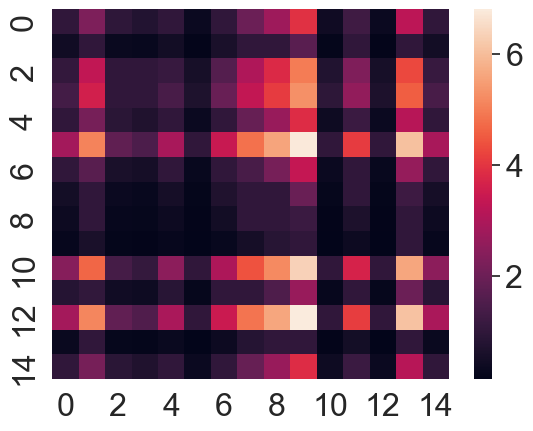

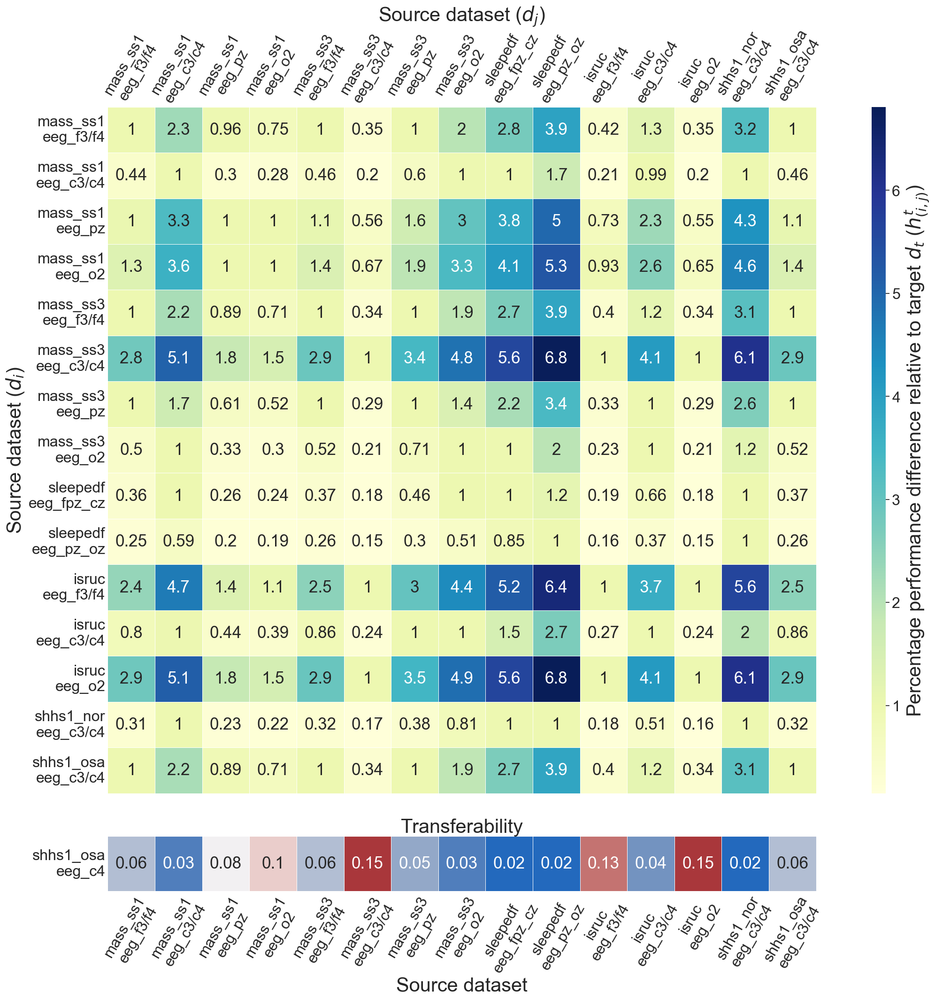

In [23]:
# 30s epoch

import seaborn as sns; sns.set_theme()
import numpy as np

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering

# type9 / type6
t1 = 9
t2 = 6
db_30s = ['mass_ss1','mass_ss3','sleepedf','isruc','shhs1_normal','shhs1_osa']
db_20s = ['mass_ss2','mass_ss4','mass_ss5']
chs = ['eeg_f','eeg_c','eeg_p','eeg_o']
print(f"{type_map[f'type{t1}']} / {type_map[f'type{t2}']}")

#### Affinity matrix ####

# target_ds = df['target_dataset'].unique()
target_ds = db_30s
tfability = OrderedDict()
for tgt_ds in target_ds:
    tgt_df = df[df['target_dataset'] == tgt_ds]
    # for tgt_ch in tgt_df['target_channel'].unique():
    for tgt_ch in sorted(tgt_df['target_channel'].unique(), key=cmp_to_key(compare)):
        tgt_ch_df = tgt_df[tgt_df['target_channel'] == tgt_ch].sort_values(by=['source_dataset','source_channel'])
        perf_mf1_type_t2 = tgt_ch_df[['target_dataset','target_channel',f'mf1_type{t1}',f'mf1_type{t2}']] \
                    .groupby(by=['target_dataset','target_channel']).mean() \
                    .reset_index().iloc[0].to_dict()[f'mf1_type{t2}']
        display(tgt_ch_df)
        print(f"Target: {tgt_ds}-{tgt_ch}")
        if tgt_ds in db_30s:
            list_ds = db_30s
        else:
            list_ds = db_20s
        i = 0
        aff_mat = np.zeros((len(list_ds)*len(chs),len(list_ds)*len(chs)))
        src_list = []
        nan_src_list = []
        for src_ds in list_ds:
            for src_ch in chs:
                perf = tgt_ch_df[(tgt_ch_df['source_dataset']==src_ds) & (tgt_ch_df['source_channel'].str.contains(src_ch))]
                if len(perf) == 1:
                    print(f'Comparing source: {src_ds}-{src_ch}')
                    # display(perf)
                    perf = perf.iloc[0].to_dict()
                    if tgt_ds == 'mass_ss1':
                        mf1 = perf[f'mf1_type{t1}'] / perf[f'mf1_type{t2}']
                    else:
                        mf1 = perf[f'mf1_type{t1}'] / perf_mf1_type_t2
                    j = 0
                    for _src_ds in list_ds:
                        for _src_ch in chs:
                            if i == j:
                                aff_mat[i,j] = 1
                            else:
                                _perf = tgt_ch_df[(tgt_ch_df['source_dataset']==_src_ds) & (tgt_ch_df['source_channel'].str.contains(_src_ch))]
                                if len(_perf) == 1:
                                    print(f'With source: {_src_ds}-{_src_ch}')
                                    # display(_perf)
                                    _perf = _perf.iloc[0].to_dict()
                                    if tgt_ds == 'mass_ss1':
                                        _mf1 = _perf[f'mf1_type{t1}'] / _perf[f'mf1_type{t2}']
                                    else:
                                        _mf1 = _perf[f'mf1_type{t1}'] / perf_mf1_type_t2
                                    diff = (mf1 - _mf1) * 100
                                    if diff >= 1:
                                        # greater
                                        aff_mat[i,j] = diff
                                    elif diff <= -1:
                                        # less
                                        aff_mat[i,j] = 1. / abs(diff)
                                    else:
                                        # equal or less than 1 percent better
                                        aff_mat[i,j] = 1
                                    # if aff_mat[i,j] >= 5:
                                    #     print(perf[f'mf1_type{t1}'], perf[f'mf1_type{t2}'], _perf[f'mf1_type{t1}'], _perf[f'mf1_type{t2}'])
                                    #     print(src_ds, src_ch, _src_ds, _src_ch, aff_mat[i,j], mf1, _mf1)
                                else:
                                    aff_mat[i,j] = float('nan')
                            j += 1
                    src_list.append(f"{perf['source_dataset']}-{perf['source_channel']}")
                else:
                    aff_mat[i,:] = float('nan')
                    nan_src_list.append(f"{src_ds}-{src_ch}")
                i += 1
        # Heatmap
        nan_src = np.where(np.isnan(aff_mat).all(axis=0))[0]
        print(f"Not available source: {nan_src_list} {nan_src}")
        aff_mat = aff_mat[~np.isnan(aff_mat).all(axis=0)]
        aff_mat = aff_mat[:,~np.all(np.isnan(aff_mat), axis=0)]
        ax = sns.heatmap(aff_mat)

        # Estimate eigenvector (not exact calculation)
        sum_cols = np.sum(aff_mat, axis=0)
        norm_aff_mat = aff_mat / sum_cols
        est_eigenvectors = np.sum(norm_aff_mat, axis=1) / norm_aff_mat.shape[1]
        print(est_eigenvectors)

        tfability[f'{tgt_ds}-{tgt_ch}'] = {}
        tfability[f'{tgt_ds}-{tgt_ch}']['src'] = src_list
        tfability[f'{tgt_ds}-{tgt_ch}']['eigenvector'] = est_eigenvectors

        # for publication
        ticklabels = [_.replace('-','\n') for _ in src_list]
        for _i, _x in enumerate(ticklabels):
            if 'eeg_f3' in _x:
                _x = _x.replace('eeg_f3','eeg_f3/f4')
            elif 'eeg_f4' in _x:
                _x = _x.replace('eeg_f4','eeg_f3/f4')
            elif 'eeg_c3' in _x:
                _x = _x.replace('eeg_c3','eeg_c3/c4')
            elif 'eeg_c4' in _x:
                _x = _x.replace('eeg_c4','eeg_c3/c4')
            ticklabels[_i] = _x.replace('_a1', '').replace('_a2', '').replace('_normal','_nor')

        label_size = 30
        sns.set(font_scale=2.1)
        gs_kw = dict(width_ratios=[1,0.02], height_ratios=[1,0.08])
        f, axs = plt.subplots(ncols=2, nrows=2, figsize=(18,18), gridspec_kw=gs_kw)
        axs[1,1].remove()
        f.tight_layout()
        axs[0,0].get_shared_y_axes().join(axs[1,0])
        ax = sns.heatmap(
            aff_mat,
            cmap="YlGnBu",
            xticklabels=ticklabels,
            yticklabels=ticklabels,
            linewidths=.5,
            annot=True,
            cbar_ax=axs[0,1],
            # cbar_kws={'label':r'$h^{t}_{(i,j)}$'},
            ax=axs[0,0])
        axs[0,0].set_yticklabels(axs[0,0].get_yticklabels(), rotation=0)
        axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=60)
        axs[0,0].xaxis.tick_top()
        axs[0,0].xaxis.set_label_position('top')
        axs[0,0].tick_params(length=0)
        axs[0,0].set_xlabel(f'Source dataset ({r"$d_j$"})', fontsize=label_size)
        axs[0,0].set_ylabel(f'Source dataset ({r"$d_i$"})', fontsize=label_size)
        axs[0,1].set_ylabel(r'Percentage performance difference relative to target $d_t$ ($h^{t}_{(i,j)}$)', fontsize=label_size)

        ax = sns.heatmap(
            [np.round(est_eigenvectors, 2)],
            cmap='vlag',
            xticklabels=ticklabels,
            yticklabels=[f"{tgt_ds}\n{tgt_ch.replace('_a1', '').replace('_a2', '').replace('_normal','_nor')}"],
            linewidths=.5,
            cbar=False,
            annot=True,
            ax=axs[1,0])
        axs[1,0].set_yticklabels(axs[1,0].get_yticklabels(), rotation=0)
        axs[1,0].set_xticklabels(axs[1,0].get_xticklabels(), rotation=60)
        axs[1,0].tick_params(length=0)
        axs[1,0].set_xlabel(f'Source dataset', fontsize=label_size)
        axs[1,0].set_title(f'Transferability', fontsize=label_size)
        plt.savefig(f'{tgt_ds}-{tgt_ch}.eps', format='eps', dpi=500, bbox_inches='tight')
        plt.show()
        plt.close('all')